# __Дипломный проект.__
##  Тема: «Модель прогнозирования стоимости жилья для агентства недвижимости».


## 0. Постановка задачи

Описание проекта: агентство недвижимости столкнулось с проблемой — риелторы тратят слишком много времени на сортировку объявлений и поиск выгодных предложений. Поэтому скорость их реакции и качество анализа не дотягивают до уровня конкурентов. Это сказывается на финансовых показателях агентства.

Задача — разработать модель машинного обучения, которая поможет обрабатывать объявления и увеличит число сделок и прибыль агентства.

Описание данных:
* 'status' — статус продажи;
* 'private pool' и 'PrivatePool' — наличие собственного бассейна; 'propertyType' — тип объекта недвижимости;
* 'street' — адрес объекта;
* 'baths' — количество ванных комнат;
* 'homeFacts' — сведения о строительстве объекта (содержит несколько типов сведений, влияющих на оценку объекта);
* 'fireplace' — наличие камина;
* 'city' — город;
* 'schools' — сведения о школах в районе;
* 'sqft' — площадь в футах;
* 'zipcode' — почтовый индекс;
* 'beds' — количество спален;
* 'state' — штат;
* 'stories' — количество этажей;
* 'mls-id' и 'MlsId' — идентификатор MLS (Multiple Listing Service, система мультилистинга);
* 'target' — цена объекта недвижимости (целевой признак, который необходимо спрогнозировать).

In [2]:
# Импортируем необходимые библиотеки:
# Библиотеки для работы с таблицами
import numpy as np
import pandas as pd

# Импортируем библиотеки для визуализации
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Библиотека для использования регулярных вырожений
import re 

# Библиотека для использования кодирования
import category_encoders as ce

# Библиотеки для статистического анализа
from scipy.stats import normaltest # тест на нормальность
from scipy.stats import kruskal # тест Краскела-Уоллиса для сравнения выборок

# Библиотеки для подгрузики информации с других источников
import requests
from bs4 import BeautifulSoup

# Убираем предупреждения
import warnings
warnings.filterwarnings("ignore")

# Загружаем специальный удобный инструмент для разделения датасета
from sklearn.model_selection import train_test_split

#  Загружаем удобный инструмент для номализации данных
from sklearn.preprocessing import MinMaxScaler

# Загружаем инструмент продакшина модели
import pickle

# Инструмент для настройки гиперпараметров
from sklearn.model_selection import GridSearchCV

# Инструмент для отбора признаков
from sklearn.feature_selection import SelectKBest, f_regression

# Библиотеки для построения моделей и их анализа
from sklearn.linear_model import LinearRegression # инструмент для создания и обучения модели
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели
from sklearn import metrics # инструменты для оценки точности модели
from sklearn.linear_model import ElasticNetCV  # инструмент для создания и обучения модели
from sklearn.tree import DecisionTreeRegressor # инструмент для создания и обучения модели
from sklearn.ensemble import  GradientBoostingRegressor # инструмент для создания и обучения модели
from catboost import CatBoostRegressor # инструмент для создания и обучения модели
from sklearn.ensemble import StackingRegressor # инструмент для создания и обучения стекинга

# 1. Загрузка и знакомство с данными

In [3]:
# Прочитаем данные
data = pd.read_csv("data/data.csv")

In [4]:
# Изучим таблицу
display(data.head(4))

# Изучим информацию о таблице
display(data.info())

# Изучим основные статистические характеристики
display(data.describe())

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
0,Active,NaN,Single Family Home,240 Heather Ln,3.5,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Gas Logs,Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900,28387,4,NC,NaN,NaN,NaN,611019,"$418,000"
1,for sale,NaN,single-family home,12911 E Heroy Ave,3 Baths,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...","1,947 sqft",99216,3 Beds,WA,2.0,NaN,NaN,201916904,"$310,000"
2,for sale,NaN,single-family home,2005 Westridge Rd,2 Baths,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",yes,Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...","3,000 sqft",90049,3 Beds,CA,1.0,NaN,yes,FR19221027,"$2,895,000"
3,for sale,NaN,single-family home,4311 Livingston Ave,8 Baths,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",yes,Dallas,"[{'rating': ['9/10', '9/10', '10/10', '9/10'],...","6,457 sqft",75205,5 Beds,TX,3.0,NaN,NaN,14191809,"$2,395,000"


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377185 entries, 0 to 377184
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   status        337267 non-null  object
 1   private pool  4181 non-null    object
 2   propertyType  342452 non-null  object
 3   street        377183 non-null  object
 4   baths         270847 non-null  object
 5   homeFacts     377185 non-null  object
 6   fireplace     103115 non-null  object
 7   city          377151 non-null  object
 8   schools       377185 non-null  object
 9   sqft          336608 non-null  object
 10  zipcode       377185 non-null  object
 11  beds          285903 non-null  object
 12  state         377185 non-null  object
 13  stories       226470 non-null  object
 14  mls-id        24942 non-null   object
 15  PrivatePool   40311 non-null   object
 16  MlsId         310305 non-null  object
 17  target        374704 non-null  object
dtypes: object(18)
memory usa

None

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
count,337267,4181,342452,377183,270847,377185,103115,377151,377185,336608,377185,285903,377185,226470,24942,40311,310305,374704
unique,159,1,1280,337076,229,321009,1653,2026,297365,25405,4549,1184,39,348,24907,2,232944,43939
top,for sale,Yes,single-family home,Address Not Disclosed,2 Baths,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",yes,Houston,"[{'rating': [], 'data': {'Distance': [], 'Grad...",0,32137,3 Beds,FL,1.0,No MLS#,yes,NO MLS,"$225,000"
freq,156104,4181,92206,672,52466,7174,50356,24442,4204,11854,2141,53459,115449,67454,3,28793,24,1462


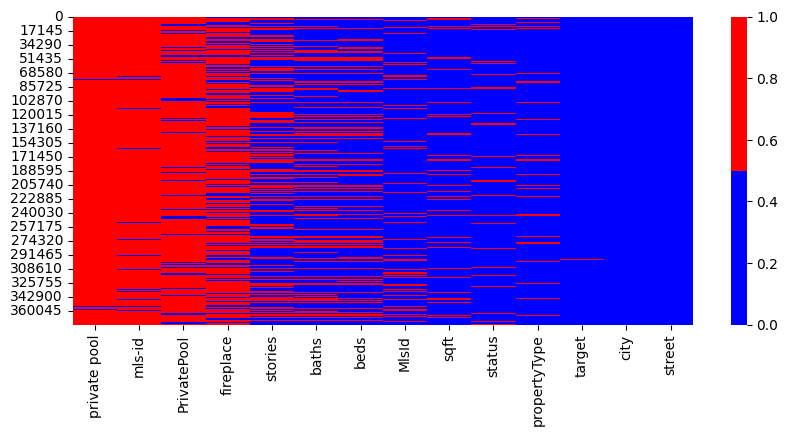

In [5]:
# Посмотрим тепловую карту пропусков
colors = ["blue", "red"] 
fig = plt.figure(figsize=(10, 4))
cols_null_percent = data.isnull().mean() * 100
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
cols = cols_with_null.index
ax = sns.heatmap(
    data[cols].isnull(),
    cmap=sns.color_palette(colors),
)

In [6]:
# Переменный, которые понадобятся в работе
year_new = 2023 # текущий год, понадобиться для признака возраст постройки
alpha = 0.05 # уровень значимости, нужен для статистического теста

Вывод: Данные содержат в себе 18 признаков и 377185 записи. По тепловой карте видно, что данные имеют большое количество пропусков. Они присутствуют в признаках status, private pool, propertyType, street, baths, fireplace, city, sqft, beds, stories, mls-id, PrivatePool, MlsId, target. Признаки homeFacts и schools представляют собой словари. Признаки private pool и PrivatePool отображают одно и то же, при этом в PrivatePool меньше пропусков. Признаки mls-id и MlsId тоже отображают одно и то же, при этом в MlsId меньше пропусков. Признаки status, propertyType, street,  baths, homeFacts,   fireplace, city, schools, sqft, zipcode, beds, stories,mls-id, MlsId содержат в себе много уникальных обозначений.

Перед исследованием данных и созданием модели необходимо очистить датасет от пропусков, выбросов и дубликатов, так же нужно сократить уникальные данные в признаках. Еще будем удалять не нужные переменные с помощью del, точнее разрывать связь между переменной и ссылкой, чтобы сборщик мусора точно их убрал и память не перегружалась.

# 2. Подготовка данных. Очистка данных

### 2.1 Работа с данными на наличие собственного бассейна

In [7]:
# Смотрим уникальные значения в признаках PrivatePool и private pool
print(data["PrivatePool"].value_counts())
print(data["private pool"].value_counts())

yes    28793
Yes    11518
Name: PrivatePool, dtype: int64
Yes    4181
Name: private pool, dtype: int64


Видим, что данные содержат в себе только понятие yes. Из этого можно сделать вывод, что если в признаке ничего не указано, значит бассейна нет. 

Нам не нужно два признака с дублирующей информацией, поэтому дополним признак PrivatePool, так как в нем больше информации признаком private pool. Приведем все к нижнему регистру, yes заменим на 1, а пропуски 0.

In [8]:
#  Объединим столбцы private pool и PrivatePool в столбец private pool
data["private pool"] = data["PrivatePool"].combine_first(data["private pool"])

# Преобразуем данные в строки
data["private pool"] = data["private pool"].astype(str)

# Преобразуем все в строчные буквы
data["private pool"] = data["private pool"].apply(lambda x: x.lower())

# Меняем nan на no, так как если бассейн не указан будем считать, что его нет
data["private pool"] = data["private pool"].apply(lambda x: x.replace("nan", "no"))

# Удаляем столбик PrivatePool
data.drop(["PrivatePool"], axis=1, inplace=True)

# Посчитаем пропущенные значения
omissions = data["private pool"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в private pool - {omissions}, что составляет {omissions_share}%.")

# Заменим слова цифрами 0 отсутствие бассейна, 1 наличие бассейна
data["private pool"] = data["private pool"].apply(lambda x: 0 if "no" in x else 1)

Количество пропущенных значений в private pool - 0, что составляет 0.0%.


### 2.2 Работа с данными об идентификаторе MLS

In [9]:
# Смотрим уникальные значения
print(data["mls-id"].value_counts().head(4))
print(data["MlsId"].value_counts().head(4))

No MLS#     3
No          3
1498550     2
39888954    2
Name: mls-id, dtype: int64
NO MLS                     24
No MLS #                   16
 A, Houston, TX 77008      13
 12A, Orlando, FL 32833    11
Name: MlsId, dtype: int64


Из знакомства с данными мы знаем, что эти признаки имеют пропуски, а так же много уникальных значений. Их можно удалить, но иногда в них встречается информация о городе и штате. В признаке штат нет пропусков, но в признаке город есть. Поэтому перед их удалением мы вытащим города, чтобы попробовать закрыть пропуски. Но сначала объединим mls-id и MlsId.

In [10]:
# Объединим столбцы mls-id и MlsId в mls-id
data["mls-id"] = data["MlsId"].combine_first(data["mls-id"])

# Преобразуем данные в строки
data["mls-id"] = data["mls-id"].astype(str)

# Преобразуем все в строчные буквы
data["mls-id"] = data["mls-id"].apply(lambda x: x.lower())

# Обозначим отсутствие данных одним обозначением no
data["mls-id"] = data["mls-id"].apply(lambda x: "no" if ("nan" in x) or ("no mls" in x) \
                                                         or ("no mls #" in x) or ("no" in x) else x)  

# Смотрим уникальные значения
print(data["mls-id"].value_counts().head(2))
# Видим что в столбике есть города, их можно достать, чтоб заполнить пропуски в признаке city

# Удаляем столбик MlsId
data.drop(["MlsId"], axis=1, inplace=True)

# Смотрим количество  уникальных значений
mks_nunique = data["mls-id"].nunique()
print(f"Количество уникальных значений mls-id: {mks_nunique}")
del mks_nunique # удалим не нужную переменную mks_nunique

# Посчитаем пропущенные значения
omissions = data["mls-id"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в mls-id - {omissions}, что составляет {omissions_share}%.")

no                       42107
 a, houston, tx 77008       13
Name: mls-id, dtype: int64
Количество уникальных значений mls-id: 248908
Количество пропущенных значений в mls-id - 0, что составляет 0.0%.


In [11]:
# Видим что город обычно стоит на втором месте после запятой
# Создали функцию, которая будет доставать город из признака mls-id
def get_city(result):
    if "," in result:
        result = result.split(",")
        return result[1]
    else:
        np.nan
    
# Выполняем функцию get_city
data["city 1"] = data["mls-id"].apply(get_city)

# Преобразуем результат в строку
data["city 1"] = data["city 1"].astype(str)

# Если строка содержит лишние символы заменяем ее на пустоту
data["city 1"] = data["city 1"].apply(lambda x: np.nan if ("1" in x) or ("None" in x) or ("3" in x) or ("0" in x) else x)

# Удаляем столбик mls-id
data.drop(["mls-id"], axis=1, inplace=True)

Признаком city 1 воспользуемся позже, когда будем закрывать пропуски в city.

### 2.3 Убираем дубликаты в датасете 

После того как мы разобрали дублирующие признаки, посмотрим есть ли дубликаты, если есть то удалим их.

In [12]:
# Найдем дубликаты в датасете
dupl_columns = list(data.columns) 
mask = data.duplicated(subset=dupl_columns)
duplicates = data[mask]

# Выведем число дубликатов
print(f"Число найденных дубликатов: {duplicates.shape[0]}")

# Удалим дубликаты из датасета
data.drop_duplicates(inplace=True, ignore_index=True)

Число найденных дубликатов: 141


### 2.4 Работа с данными о статусе продажи

In [13]:
# Смотрим уникальные значения
print(data["status"].value_counts().head(7))

# Смотрим количество  уникальных значений
status_nunique = data["status"].nunique()
print(f"Количество уникальных значений status: {status_nunique}")
del status_nunique # удалим не нужную переменную mks_nunique

for sale            156052
Active              105125
For sale             43464
foreclosure           6425
New construction      5474
Pending               4701
Pre-foreclosure       2119
Name: status, dtype: int64
Количество уникальных значений status: 159


В этом признаке много уникальных обозначений. Сократим их по смыслу до девяти. Пропущенные и редко встречающиеся статусы объединим под словом other. Так же удалим данные содержащие в себе аренду, так как они будут мешать модели в определении цены продажи.

active                      305104
other                        42322
foreclosure                  10908
new                           6274
pending                       5363
properties can be viewed      3756
auction                       1510
contingency                   1090
closed                         305
Name: status, dtype: int64

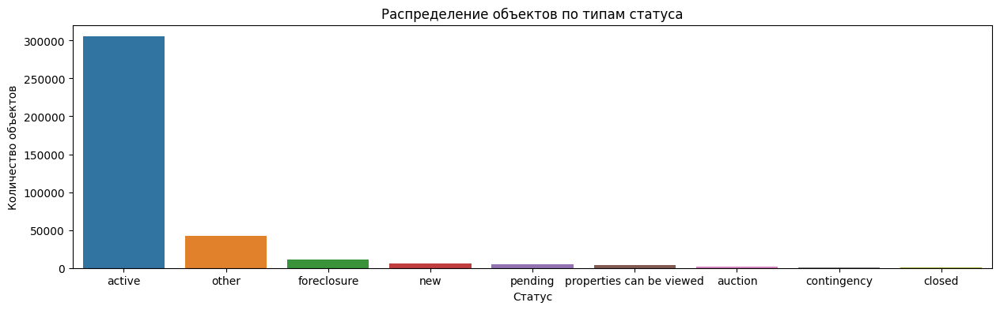

In [14]:
# Преобразуем данные в строки
data["status"] = data["status"].astype(str)

# Преобразуем все в строчные буквы и уберем пробелы из начала и конца
data["status"] = data["status"].apply(lambda x: x.lower().strip())

# Удалим строки со статусом rent, так как данная недвижимость сдается,
# а не продается, они могут помешать модели правильно определять цену недвижимости
rent = data[data["status"].str.contains("rent", case=False) == True].index
data.drop(rent, axis=0, inplace=True)



# Обозначим, что не продается словосочетанием closed
data["status"] = data["status"].apply(lambda x: "closed" if ("recently sold" in x) else x)

# Обозначим, что "лишён права выкупа" словом foreclosure, продажа будет отличаться от традиционной
data["status"] = data["status"].apply(lambda x: "foreclosure" if ("foreclosed" in x) or ("foreclosure" in x) else x)  

# Обозначим, что продажа недвижимости осуществляется с помощью аукциона словосочетанием auction
data["status"] = data["status"].apply(lambda x: "auction" if "auction" in x else x) 

# Обозначим, что продается новая недвижимость словом new
data["status"] = data["status"].apply(lambda x: "new" if ("new construction" in x) or ("coming soon" in x) else x)  

# Обозначим, что статус недвижимость в ожидании словом pending
data["status"] = data["status"].apply(lambda x: "pending" if "pending" in x else x)  

# Обозначим, что есть дополнительные обстоятельства словом contingency
data["status"] = data["status"].apply(lambda x: "contingency" if ("contingency" in x) or ("continue" in x) \
    or ("contingency" in x) or ("conting" in x) else x)  

# Обозначим, что недвижимость уже кого-то заинтересовала, но ее еще можно посмотреть словосочетанием properties can be viewed
data["status"] = data["status"].apply(lambda x: "properties can be viewed" if ("under contract showing" in x) or ("under contract show" in x) \
    or ("under contract" in x) or ("under contract" in x) or ("active under contract" in x) or ("under contract backups" in x)\
        or ("active backup" in x) or ("backup contract" in x) or ("pending backup wanted" in x) or ("pending continue show" in x)\
            or ("active with offer" in x) or ("active with contract" in x) else x)

# Обозначим, что просто продается словом active
data["status"] = data["status"].apply(lambda x: "active" if ("sale" in x) or ("activated" in x) \
    or ("a active" in x) or ("active" in x)  or ("reactivated" in x) else x)

# Обозначим, оставшиеся версии продажи словом other. При этом добавим к этой группе пропуски, так как их статус не известен
data["status"] = data["status"].apply(lambda x: x if ("auction" in x) or ("coming soon" in x) or ("closed" in x)\
    or ("foreclosure" in x) or ("new" in x) or ("properties can be viewed" in x) or ("active" in x)  or\
        ("pending" in x) or ("contingency" in x) else "other") 



# Смотрим уникальные значения
display(data["status"].value_counts())



# Проверим, что все cnfnecs рассортированы. Посмотрим их соотношение
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 4))
barplot = sns.barplot(
    data = data["status"].value_counts().to_frame().reset_index(),
    y = "status",
    x = "index"
);
barplot.set_title("Распределение объектов по типам статуса");
barplot.set_xlabel("Статус");
barplot.set_ylabel("Количество объектов");

Самый распространенный статус active.

Удалим статус closed, так как он означает, что недвижимость не продается, а так же такой статус имеют лишь 305 объектов. И он может помешать модели правильно определять цену недвижимости.

In [15]:
# Удалим строки со статусом closed
closed = data[data["status"].str.contains("closed", case=False) == True].index
data.drop(closed, axis=0, inplace=True)

### 2.5 Работа с данными о сведениях о строительстве объекта

In [16]:
# Посмотрим что содержит в себе признак homeFacts
data["homeFacts"][20]

"{'atAGlanceFacts': [{'factValue': '1989', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': 'Forced air', 'factLabel': 'Heating'}, {'factValue': 'Central, Evaporative', 'factLabel': 'Cooling'}, {'factValue': 'Attached Garage', 'factLabel': 'Parking'}, {'factValue': '1.18 acres', 'factLabel': 'lotsize'}, {'factValue': '$217', 'factLabel': 'Price/sqft'}]}"

В данном признаке скрыто много информации. Достанем ее и разделим на новые признаки: Year built, Remodeled year, Heating, Cooling, Parking, lotsize, Price/sqft. После чего удалим признак homeFacts.

In [17]:
# Выделим с помощью регулярных ворожений нужные параметры, все данные находятся между одни и тем же набором слов
data["homeFacts"] = data["homeFacts"].str.findall(r"\bfactValue': ([\s\S]+?), 'factLabel\b")

# Смотрим, что получилось
data["homeFacts"].head()

0    ['2019', '', 'Central A/C, Heat Pump', '', '',...
1    ['2019', '', '', '', '', '5828 sqft', '$159/sq...
2    ['1961', '1967', 'Forced Air', 'Central', 'Att...
3    ['2006', '2006', 'Forced Air', 'Central', 'Det...
4            ['', '', '', '', '', '10,019 sqft', None]
Name: homeFacts, dtype: object

In [18]:
# Выводим признак год постройки
data["year built"] = data["homeFacts"].apply(lambda x: x[0])

# Выводим признак год реконструкции
data["remodeled year"] = data["homeFacts"].apply(lambda x: x[1])

# Выводим признак обогрев
data["heating"] = data["homeFacts"].apply(lambda x: x[2])
data["heating"] = data["heating"].apply(lambda x: x.lower().strip()) # преобразуем все в строчные буквы и уберем пробелы из начала и конца

# Выводим признак охлаждение
data["cooling"] = data["homeFacts"].apply(lambda x: x[3])
data["cooling"] = data["cooling"].apply(lambda x: x.lower().strip()) # преобразуем все в строчные буквы и уберем пробелы из начала и конца

# Выводим признак стоянка
data["parking"] = data["homeFacts"].apply(lambda x: x[4])
data["parking"] = data["parking"].apply(lambda x: x.lower().strip()) # преобразуем все в строчные буквы и уберем пробелы из начала и конца

# Выводим признак размер
data["lotsize"] = data["homeFacts"].apply(lambda x: x[5])
data["lotsize"] = data["lotsize"].apply(lambda x: x.lower().strip()) # преобразуем все в строчные буквы и уберем пробелы из начала и конца

# Выводим признак цена/площадь
data["price/sqft"] = data["homeFacts"].apply(lambda x: x[6])
data["price/sqft"] = data["price/sqft"].apply(lambda x: x.lower().strip()) # преобразуем все в строчные буквы и уберем пробелы из начала и конца

# Удаляем столбик homeFact
data.drop(["homeFacts"], axis=1, inplace=True)

Признаки year built, remodeled year, price/sqft содержат в себе числа и лишние символы. Достанем из них только числа. И посмотрим сколько пропусков получили для новых признаков.

In [19]:
# Подготовим новые числовые признаки
# Создаем функцию, которая выводит числа в список, потом выводит число из начала списка, если ничего нет то выводит пустоту
def get_highlights_numbers_list(nums):
    nums = re.findall(r"\d*\.\d+|\d+", nums)
    if len(nums) > 0:
        nums = nums[0]
        return float(nums)
    else: 
        return np.nan 

# Создаем функцию, которая выводит числа в список, если они идут 4 раза подряд, потом достает число из начала списка, если нет то выводит пустоту.
# Смотрит, что число меньше или равно текущему году и выводит его, если не соответствует то выводит пустоту
# Переменная year_new находиться в пункте 1. загрузка и знакомство с данными.
def get_highlights_numbers_list_year(nums):
    nums = re.findall(r"[0-9][0-9][0-9][0-9]", nums)
    if len(nums) > 0:
        nums = nums[0]
        nums = float(nums)
        if nums <= year_new: 
            return nums
        else: 
            return np.nan
    else: 
        return np.nan 

# Переводим год постройки в число с помощью функции get_highlights_numbers_list_year 
data["year built"] = data["year built"].apply(get_highlights_numbers_list_year)

# Переводим год реконструкции в число с помощью функции get_highlights_numbers_list_year 
data["remodeled year"] = data["remodeled year"].apply(get_highlights_numbers_list_year)

# Переводим признак цена/площадь в число с помощью функции  get_highlights_numbers_list 
data["price/sqft"] = data["price/sqft"].apply(get_highlights_numbers_list)
data["price/sqft"] = data["price/sqft"].apply(lambda x: np.nan if x == 0.0 else x) # заменяем нули на пропуск

# Посчитаем пропущенные значения в новых признаках 
omissions = data["year built"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в year built - {omissions}, что составляет {omissions_share}%.")

omissions = data["remodeled year"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в remodeled year - {omissions}, что составляет {omissions_share}%.")

omissions = data["price/sqft"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в price/sqft - {omissions}, что составляет {omissions_share}%.")

Количество пропущенных значений в year built - 63451, что составляет 16.86%.
Количество пропущенных значений в remodeled year - 225721, что составляет 59.98%.
Количество пропущенных значений в price/sqft - 65610, что составляет 17.43%.


Признак remodeled year имеет больше половины пропусков. Признак year built и price/sqft имеют пропуски. Мы объединим признаки year built и remodeled year и таким получим дату, когда здание было введено в эксплуатацию(построено или реконструировано). Из полученного признака можно сделать новый - возраст постройки. Признак price/sqft, пока трогать не будем, может он поможет нам закрыть пропуски в дальнейшем. Потом его удалим, так как иначе произойдет утечка информации.

In [20]:
# В данных есть года, которые похожи на опечатку, исправим их
data["year built"] = data["year built"].apply(lambda x: 1919 if x == 1019 else x) # уберем опечатку
data["year built"] = data["year built"].apply(lambda x: 1957 if x == 1057 else x) # уберем опечатку
data["year built"] = data["year built"].apply(lambda x: 1960 if x == 1060 else x) # уберем опечатку
data["year built"] = data["year built"].apply(lambda x: np.nan if x == 1208 else x) # уберем маленький год, оставим пропуск

# Объединим столбцы year built и remodeled year в year built
data["year built"] = data[["year built", "remodeled year"]].apply(lambda x: x["remodeled year"] if x["year built"] < x["remodeled year"]\
    else x["year built"], axis=1)

# Создадим новый признак возраст здания с момента постройки или реставрации
data["age"] = data["year built"].apply(lambda x: year_new - x)

# Посчитаем пропущенные значения в новом признаке 
omissions = data["age"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в age - {omissions}, что составляет {omissions_share}%.")

# Удаляем не нужные признаки year built и remodeled year
data.drop(["year built", "remodeled year"], axis=1, inplace=True)

Количество пропущенных значений в age - 63452, что составляет 16.86%.


После объединения признака year built и remodeled year и создание age количество пропусков уменьшилось до 16.86%, это значение не критично. Закроем их позже.

In [21]:
# Смотрим уникальные значения
print(data["lotsize"].value_counts())

''                  32629
none                28339
'—'                 25239
'no data'            5329
'-- sqft lot'        3819
                    ...  
'432943'                1
'12251'                 1
'13038'                 1
'7567'                  1
'7,084 sqft lot'        1
Name: lotsize, Length: 36599, dtype: int64


Мы видим, что в нем самые популярные виды признака это отсутствие информации. При этом у нас уже есть похожий признак sqft. Мы вытащим размер площади в футах в отдельный признак, который потом может помочь нам прикрыть пропуски в sqft.

In [22]:
# В признаке размер есть данные в формате sqft. Достанем их в новый признак sqft 1
data["sqft 1"] = data["lotsize"].apply(lambda x: x if "sqft" in x else "0")

# Переводим признак sqft 1 в число с помощью функции  get_highlights_numbers_list 
data["sqft 1"] = data["sqft 1"].apply(get_highlights_numbers_list)
data["sqft 1"] = data["sqft 1"].apply(lambda x: np.nan if x == 0.0 else x) # заменяем нули на пропуск

# Удаляем признак lotsize
data.drop(["lotsize"], axis=1, inplace=True)

Посмотрим новый признак heating.

In [23]:
# Выводим признак обогрев
print(data["heating"].value_counts().head(5))

# Смотрим количество  уникальных значений
heating_nunique = data["heating"].nunique()
print(f"Количество уникальных значений heating: {heating_nunique}")
del heating_nunique # удалим не нужную переменную heating_nunique

'forced air'    134118
''              105392
'other'          29580
'electric'       10207
'gas'             9283
Name: heating, dtype: int64
Количество уникальных значений heating: 1908


В признаке много уникальных значений. Приведем их к понятию есть обогрев или нет. Пропуски буду считать как отсутствие обогрева. При этом пока пропуски оставлю, так как возможно прикрою их значением в признаке fireplace, так как камин является обогревающим элементом.

In [24]:
# Заменим пустые кавычке нулем, чтобы сработала следующая lambda функция
data["heating"] = data["heating"].apply(lambda x: x.replace("''", "0")) 

# Если есть отопление выводим 1, если нет то на данный момент выведем np.nan, так как дополним его информацией из другого признака
data["heating"] = data["heating"].apply(lambda x: np.nan if ("0" in x) or ("no data" in x) or ("none" in x) else 1)  

# Посчитаем пропущенные значения 
omissions = data["heating"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в heating - {omissions}, что составляет {omissions_share}%.")

Количество пропущенных значений в heating - 117717, что составляет 31.28%.


Посмотрим новый признак cooling.

In [25]:
# Выводим признак охлаждение
print(data["cooling"].value_counts().head(5))

# Смотрим количество уникальных значений
cooling_nunique = data["cooling"].nunique()
print(f"Количество уникальных значений cooling: {cooling_nunique}")
del cooling_nunique # удалим не нужную переменную cooling_nunique

'central'        158549
''               119829
'central air'     14383
'no data'         10615
'has cooling'      9729
Name: cooling, dtype: int64
Количество уникальных значений cooling: 1439


В признаке много уникальных обозначений. Приведем их к понятию есть охлаждение или нет. Отсутствие информации будем считать как нет. Так же в этом признаке есть информация об обогреве. Достанем ее и дополним признак heating.

In [26]:
# В признаке cooling упоминается отопление, создадим временный признак heating 1
data["heating 1"] = data["cooling"].apply(lambda x: 1 if ("heating" in x) or ("heat" in x) or ("gas" in x) else np.nan)
  
# Объединим столбцы heating и heating 1, так чтобы дополнить не достающую информацию для признака heating
data["heating"] = data["heating"].combine_first(data["heating 1"])

# Посчитаем пропущенные значения
omissions = data["heating"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в heating - {omissions}, что составляет {omissions_share}%.")

# Удаляем не нужный признак heating 1
data.drop(["heating 1"], axis=1, inplace=True)

# Заменим пустые кавычке нулем, чтобы сработала следующая lambda функция
data["cooling"] = data["cooling"].apply(lambda x: x.replace("''", "0"))

# Если есть охлаждение выводим 1, если нет то выведем 0
data["cooling"] = data["cooling"].apply(lambda x: 0 if ("0" in x) or ("no data" in x) or ("none" in x) else 1)  

Количество пропущенных значений в heating - 111191, что составляет 29.55%.


Количество пропущенных значений в heating немного уменьшилось.

В признаке cooling, теперь нет пропусков, так же мы сократили количество неизвестной информации для признака heating.

Посмотрим новый признак parking.

In [27]:
# Выводим признак парковка
print(data["parking"].value_counts().head(5))

# Смотрим количество уникальных значений
parking_nunique = data["parking"].nunique()
print(f"Количество уникальных значений parking: {parking_nunique}")
del parking_nunique # удалим не нужную переменную parking_nunique

''                   171447
'attached garage'     70634
'2 spaces'            28059
'1 space'             14245
'no data'             13332
Name: parking, dtype: int64
Количество уникальных значений parking: 3320


В основном мы видим, что информация о парковке отсутствует. Будем считать это признаком отсутствия стоянки для машин.

In [28]:
# Заменим пустые кавычке нулем, чтобы сработала следующая lambda функция
data["parking"] = data["parking"].apply(lambda x: x.replace("''", "0"))

# Выводим признак стоянка. Если информации о стоянки нет, буду исходить из того что ее рядом нет
data["parking"] = data["parking"].apply(lambda x: 0 if ("0" in x) or ("no data" in x) or ("none" in x) else 1)

# Посчитаем пропущенные значения 
omissions = data["parking"].isna().sum()
omissions_share = round(omissions/ data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в parking - {omissions}, что составляет {omissions_share}%.")

Количество пропущенных значений в parking - 0, что составляет 0.0%.


### 2.6 Работа с данными о сведениях о школах в районе

In [29]:
# Посмотрим что содержит в себе признак schools
data["schools"][0]

'[{\'rating\': [\'4\', \'4\', \'7\', \'NR\', \'4\', \'7\', \'NR\', \'NR\'], \'data\': {\'Distance\': [\'2.7 mi\', \'3.6 mi\', \'5.1 mi\', \'4.0 mi\', \'10.5 mi\', \'12.6 mi\', \'2.7 mi\', \'3.1 mi\'], \'Grades\': [\'3–5\', \'6–8\', \'9–12\', \'PK–2\', \'6–8\', \'9–12\', \'PK–5\', \'K–12\']}, \'name\': [\'Southern Pines Elementary School\', \'Southern Middle School\', \'Pinecrest High School\', \'Southern Pines Primary School\', "Crain\'s Creek Middle School", \'Union Pines High School\', \'Episcopal Day Private School\', \'Calvary Christian Private School\']}]'

Выделяем новые признаки rating, distance, grades, name.

In [30]:
# Делаем функцию, которая уберет лишние знаки, сделает данные удобными для доставания информации для новых признаков
# В этот раз не использовала регулярные ворожения, так как данные скрыты между разними словами
def get_schools(review):
    for x, y in ("[{'rating': [", ""), (", 'data': {'Distance': ", ""), (", 'Grades': ", ""), ("}, 'name': ", ""), ("}]]", ""), ("'", ""):
        review = review.replace(x, y)
    review = review.lower().strip().split("][")
    return review

# Выполняем функцию get_schools
data["schools"] = data["schools"].apply(get_schools)

# Смотрим, что получилось
data["schools"].head(4)

0    [4, 4, 7, nr, 4, 7, nr, nr, 2.7 mi, 3.6 mi, 5....
1    [4/10, none/10, 4/10, 1.65mi, 1.32mi, 1.01mi, ...
2    [8/10, 4/10, 8/10, 1.19mi, 2.06mi, 2.63mi, 6-8...
3    [9/10, 9/10, 10/10, 9/10, 1.05mi, 0.1mi, 1.05m...
Name: schools, dtype: object

In [31]:
# Выводим признак рейтинг школ
data["rating schools"] = data["schools"].apply(lambda x: x[0])

# Выводим признак растояние до школ
data["distance schools"] = data["schools"].apply(lambda x: x[1])

# Выводим признак оценки школ
data["grades schools"] = data["schools"].apply(lambda x: x[2])

# Выводим признак названия школ
data["name schools"] = data["schools"].apply(lambda x: x[3])

# Удаляем столбик schools
data.drop(["schools"], axis=1, inplace=True)

# Создаем новый признак число школ, разделив названия по запятой
data["number school"] = data["name schools"].apply(lambda x: len(x.split(",")))

# Создаем новый признак наличие частных школ в районе
data["there is a private school"] = data["name schools"].apply(lambda x: 1 if "private" in x else 0)

# Посчитаем пропущенные значения
omissions = data["rating schools"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в rating schools - {omissions}, что составляет {omissions_share}%.")

omissions = data["distance schools"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в distance schools - {omissions}, что составляет {omissions_share}%.")

omissions = data["grades schools"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в grades schools - {omissions}, что составляет {omissions_share}%.")

omissions = data["number school"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в number school - {omissions}, что составляет {omissions_share}%.")

omissions = data["there is a private school"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в there is a private school- {omissions}, что составляет {omissions_share}%.")

Количество пропущенных значений в rating schools - 0, что составляет 0.0%.
Количество пропущенных значений в distance schools - 0, что составляет 0.0%.
Количество пропущенных значений в grades schools - 0, что составляет 0.0%.
Количество пропущенных значений в number school - 0, что составляет 0.0%.
Количество пропущенных значений в there is a private school- 0, что составляет 0.0%.


Из признака name schools, создадили признак number school - число школ, а так же признак there is a private school - наличие частной школы. Перед покупкой недвижимости для многих важно количество школ во круге, так же присутствие в районе частной школы, может свидетельствовать о том, что это дорогой район. Потом признак name schools можно удалить, так как точные названия школ не так важны. Так же признак grades schools можно удалить, он не несет в себе важной уникальной информации.

In [32]:
# Удаляем не нужные признаки
data.drop(["name schools", "grades schools"], axis=1, inplace=True)

# Создали функцию, которая выведет числа из признаков
def gets_the_numbers(nums):
    nums = re.findall(r'\d*\.\d+|\d+', nums)
    nums = [float(i) for i in nums]
    return nums

# Выполняем функцию gets_the_numbers
data["distance schools"] = data["distance schools"].apply(gets_the_numbers)
data["rating schools"] = data["rating schools"].apply(gets_the_numbers)

# Создали новые признаки максимальное и минимальное расстояние до школы. Если данных нет, ты выводим пустоту
data["distance schools min"] = data["distance schools"].apply(lambda x: min(x) if len(x)>0 else np.nan)
data["distance schools max"] = data["distance schools"].apply(lambda x: max(x) if len(x)>0 else np.nan)

# Создали новые признаки максимальный рейтинг школы и средний рейтинг школ. Если данных нет, ты выводим пустоту
data["rating schools max"] = data["rating schools"].apply(lambda x:  max(x) if len(x)>0 else np.nan)
data["rating schools mean"] = data["rating schools"].apply(lambda x:  sum(x)/len(x) if len(x)>0 else np.nan)

# Удаляем не нужный признак 
data.drop(["distance schools", "rating schools"], axis=1, inplace=True)

# Посчитаем пропущенные значения
omissions = data["distance schools min"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в distance schools min - {omissions}, что составляет {omissions_share}%.")

omissions = data["distance schools max"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в distance schools max - {omissions}, что составляет {omissions_share}%.")

omissions = data["rating schools max"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в rating schools max - {omissions}, что составляет {omissions_share}%.")

omissions = data["rating schools mean"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в rating schools mean- {omissions}, что составляет {omissions_share}%.")

Количество пропущенных значений в distance schools min - 4248, что составляет 1.13%.
Количество пропущенных значений в distance schools max - 4248, что составляет 1.13%.
Количество пропущенных значений в rating schools max - 5085, что составляет 1.35%.
Количество пропущенных значений в rating schools mean- 5085, что составляет 1.35%.


Мы ввели новые признаки distance schools min и distance schools max. Они показывают насколько близко может быть школа и на какое максимальное расстояние может понадобиться добираться до школы в районе. Многие хотят чтобы школа было как можно ближе к дому.

Помимо двух предыдущих создали еще два признака rating schools max и rating schools mean. Они показывают рейтинг школ рядом с недвижимостью. Если максимальный рейтинг низкий, значит школы в районе не очень. Средний помогает определить примерно какое качество школы в районе.

В данных есть пропуски заполним их позже.

### 2.7 Работа с данными о типе объекта недвижимости

In [33]:
# Смотрим уникальные значения
print(data["propertyType"].value_counts().head(7))

# Смотрим количество  уникальных значений
pt_nunique = data["propertyType"].nunique()
print(f"Количество уникальных значений propertyType: {pt_nunique}")
del pt_nunique # удалим не нужную переменную pt_nunique

# Посчитаем пропущенные значения
omissions = data["propertyType"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в propertyType - {omissions}, что составляет {omissions_share}%.")

single-family home    91799
Single Family         62867
Single Family Home    31691
condo                 25914
lot/land              20509
Condo                 16553
townhouse             11390
Name: propertyType, dtype: int64
Количество уникальных значений propertyType: 1279
Количество пропущенных значений в propertyType - 34714, что составляет 9.22%.


По данным видно, что самое популярное жилье Single Family. В данных много уникальных значений, которые могут означать одно и тоже. Так же есть пропуски в относительно небольшом количестве. Начнем с того чтобы приведем хотя бы основные понятия к одному стандарту.

In [34]:
# Преобразуем данные в строки
data["propertyType"] = data["propertyType"].astype(str)

# Преобразуем все в строчные буквы и уберем пробелы из начала и конца
data["propertyType"] = data["propertyType"].apply(lambda x: x.lower().strip())

# Делаем функцию, которая преобразуем сокращения в признаке propertyType
def get_property_type_reduc(result):
    for x, y in ("modular", "manufactured home"), ("prefab", "manufactured home"), ("mobile", "manufactured home"), ("mo2le", "manufactured home"),\
        ("mo2 le", "manufactured home"), ("ca2 n", "cabin"), ("ca2n", "cabin"), ("mid-century", "midcentury"), ("mid century", "midcentury"),\
        ("single-family home", "single family"), ("multi-family", "multi family"):
        result = result.replace(x, y)    
    return result

# Выполняем функцию get_property_type_reduc
data["propertyType"] = data["propertyType"].apply(get_property_type_reduc)  

# Смотрим количество  уникальных значений
pt_nunique = data["propertyType"].nunique()
print(f"Количество уникальных значений propertyType: {pt_nunique}")
del pt_nunique # удалим не нужную переменную pt_nunique

# Смотрим уникальные значения
print(data["propertyType"].value_counts().head(7))

Количество уникальных значений propertyType: 1269
single family         154666
condo                  42467
nan                    34714
single family home     31691
lot/land               20509
townhouse              18326
land                   10899
Name: propertyType, dtype: int64


В данных есть информация о количестве этажей. Выведем ее в отдельный признак stories 1. Возможно он поможет закрыть нам пропуски в stories.

Так же в данных слишком много уникальных значений. Сведем их по смыслу и популярности к 9 вариантам. Пропуски отнесем к other. 

single family     195776
condo              47854
other              43634
land               31471
townhouse          27016
multifamily        12609
house in style     11663
manufactured        3573
ranch               2731
Name: propertyType, dtype: int64


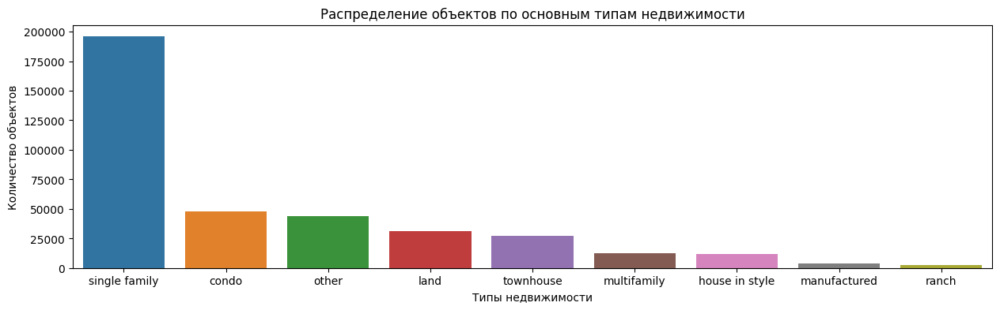

In [35]:
# Функция для выделения числа этажей с помощью регулярного ворожения. Если строка пустая или не было числа этажей возвращаем пустоту
def get_story_num(review):
    if review is np.nan:
        result = np.nan  
    else:
        result = re.findall(r"(\w+)\+*\s[Sstor]", review) # выделяем число этажей
        if len(result) > 0:
            result = result[0] 
        else:
            result = np.nan 
    return result

# Делаем функцию, которая словесное обозначение числа поменяет на число
def get_numbers(result):
    for x, y in ("one", "1"), ("two", "2"), ("three", "3"), ("four", "4"), ("five", "5"):
        result = result.replace(x, y)       
    return result


# Выполняем функцию  get_numbers
data["stories 1"] = data["propertyType"].apply( get_numbers)

# Выполняем функцию get_story_nu
data["stories 1"] = data["propertyType"].apply(get_story_num)

# Преобразуем данные в строку
data["stories 1"] = data["stories 1"].astype(str)

# Выполняем функцию get_highlights_numbers_lis, достает число
data["stories 1"] = data["stories 1"].apply(get_highlights_numbers_list)



# Обозначим, что тип объекта недвижимости многоквартирный дом словом multifamily
data["propertyType"] = data["propertyType"].apply(lambda x: "multifamily" if ("multi" in x) or ("multifamily" in x) \
    or ("duplex" in x) or ("triplex" in x) or ("fourplex" in x) or ("multi-family" in x) or ("multi_level" in x) else x)

# Обозначим, что тип объекта недвижимости таунхаус словом townhouse
data["propertyType"] = data["propertyType"].apply(lambda x: "townhouse" if ("town" in x) or ("townhouse" in x)\
     or ("townhome" in x) or ("townhouse-interior" in x) or ("townhouse-end" in x) else x)

# Обозначим, что тип объекта недвижимости земля словом land
data["propertyType"] = data["propertyType"].apply(lambda x: "land" if ("lot" in x) or ("land" in x) or ("lot/land" in x) else x)

# Обозначим, что тип объекта недвижимости дешевое жилье словом manufactured
data["propertyType"] = data["propertyType"].apply(lambda x: "manufactured" if ("manufactured" in x) or ("mobile/manufactured" in x)\
    or ("manufactured home" in x) else x)

# Обозначим, что тип объекта недвижимости квартира словом condo
data["propertyType"] = data["propertyType"].apply(lambda x: "condo" if ("apart" in x) or ("condo" in x) or ("coop" in x) or\
    ("mid.rise" in x) or ("high.rise" in x) or ("apartment" in x) or ("condominium" in x) or ("cooperative" in x)\
        or ("flats" in x) or ("studio" in x) or ("co-op" in x) or ("high-rise" in x) or ("mid-rise" in x) or ("low-rise" in x) else x)

# Обозначим, что тип объекта недвижимости односемейный дом словом single family
data["propertyType"] = data["propertyType"].apply(lambda x: "single family" if ("single family" in x) or ("story" in x) or ("detached" in x)\
    or ("single" in x) or ("single wide mh" in x) or ("cottage" in x) else x)

# Обозначим, что тип объекта недвижимости деревенский словом ranch
data["propertyType"] = data["propertyType"].apply(lambda x: "ranch" if ("ranch" in x) or ("farmhouse" in x) or ("log home" in x)\
    else x)

# Обозначим, что тип объекта недвижимости в какомто стиле словом house in style
data["propertyType"] = data["propertyType"].apply(lambda x: "house in style" if ("traditional" in x) or ("contemporary" in x) \
    or ("modern" in x) or ("modernist" in x) or ("craftsman" in x) or ("greek revival" in x)\
        or ("french country" in x) or ("mediterranean" in x) or ("victorian" in x) or ("european" in x)\
            or ("cape cod" in x) or ("historical" in x) or ("historic" in x) or ("historical/conservation" in x) \
                or ("historic/older" in x) or ("colonial home" in x) else x)

# Обозначим, что тип объекта недвижимости исторический словом historical
data["propertyType"] = data["propertyType"].apply(lambda x: "historical" if ("historical" in x) or ("historic" in x) \
    or ("historical/conservation" in x) or ("historic/older" in x) or ("colonial home" in x) else x)

# Обозначим, остальные типы объектов недвижимости словом other
data["propertyType"] = data["propertyType"].apply(lambda x: x if ("multifamily" in x) or ("townhouse" in x) or ("land" in x)\
    or ("condo" in x) or ("single family" in x) or ("manufactured" in x) or ("house in style" in x)\
         or ("ranch" in x) else "other")

# Смотрим уникальные значения
print(data["propertyType"].value_counts())


# Проверим, что все типы недвижимости рассортированы. Посмотрим их соотношение
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 4))
barplot = sns.barplot(
    data = data["propertyType"].value_counts().to_frame().reset_index(),
    y = "propertyType",
    x = "index"
);
barplot.set_title("Распределение объектов по основным типам недвижимости");
barplot.set_xlabel("Типы недвижимости");
barplot.set_ylabel("Количество объектов");

Самый распространенный тип недвижимости single family.

### 2.8 Работа с данными об адресе объекта и почтовом индексе

In [36]:
# Смотрим уникальные значения
print(data["street"].value_counts().head(5))

# Смотрим количество  уникальных значений
street_nunique = data["street"].nunique()
print(f"Количество уникальных значений street: {street_nunique}")
del street_nunique  # удалим не нужную переменную street_nunique 

# Посчитаем пропущенные значения
omissions = data["street"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в street - {omissions}, что составляет {omissions_share}%.")

Address Not Disclosed    672
Undisclosed Address      513
(undisclosed Address)    390
Address Not Available    174
Unknown Address           72
Name: street, dtype: int64
Количество уникальных значений street: 336511
Количество пропущенных значений в street - 2, что составляет 0.0%.


In [37]:
# Смотрим уникальные значения
print(data["zipcode"].value_counts().head(5))

# Смотрим количество  уникальных значений
zipcode_nunique = data["zipcode"].nunique()
print(f"Количество уникальных значений zipcode: {zipcode_nunique}")
del zipcode_nunique  # удалим не нужную переменную zipcode_nunique 

# Посчитаем пропущенные значения
omissions = data["zipcode"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в zipcode - {omissions}, что составляет {omissions_share}%.")

32137    2140
33131    1550
34747    1486
78245    1390
34759    1333
Name: zipcode, dtype: int64
Количество уникальных значений zipcode: 4548
Количество пропущенных значений в zipcode - 0, что составляет 0.0%.


Признак zipcode не содержит в себе пропусков, а признак street имеет только 2 пропуска. Это максимально полные данные, но мы их удалим, так как название улицы не несёт смысл для обучения из-за уникальности каждой строчки. Признак zipcode, так же не нужен, потому что у него много уникальных обозначений, объединять их в группы нет необходимости из-за наличия признаков названия штатов и названия городов.

In [38]:
# Удаляем не нужный признак , "zipcode"
data.drop(["street", "zipcode"], axis=1, inplace=True)

### 2.9 Работа с данными о количестве ванных комнат

In [39]:
# Смотрим уникальные значения
display(data["baths"].value_counts().head(6))

# Смотрим количество  уникальных значений
baths_nunique = data["baths"].nunique()
print(f"Количество уникальных значений baths: {baths_nunique}")

# Посчитаем пропущенные значения
omissions = data["baths"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в baths - {omissions}, что составляет {omissions_share}%.")

2 Baths    52208
3 Baths    35438
2          20438
2.0        16574
4 Baths    14741
3.0        10868
Name: baths, dtype: int64

Количество уникальных значений baths: 228
Количество пропущенных значений в baths - 106039, что составляет 28.18%.


Достанем числа с плавающей точкой из признака baths. Наличие не целого числа хоть и кажется странным, но в описании ванных комнат могут указывать не целые числа, все зависит от комплектации. Так же в данных присутствуют аномальные значения, которые превышают тысячи или сотни. Можем предположить, что это опечатка, и нули отбросить.

In [40]:
# Преобразуем данные в строку
data["baths"] = data["baths"].astype(str)

# Делаем функцию выделяющую число ванн из строки с помощью регулярного ворожения. Если строка пуста выводим пустоту
def get_bath_num(result):
    if len(result) > 0:
        result = re.findall(r'\d+\.*,*\d*', result) # выделяем число ванных
        if len(result) > 0: # проверяем, что строка не пуста
            result = result[0] # выводим первое число
            result = float(result.replace(',', '')) # убираем запятые и выводим число с плавающей точкой
            if result >= 1000: # устраняем опечатку
                result = result / 1000
                return result
            if result >= 100: # устраняем опечатку
                result = result / 100
                return result
            return result
        else:
            return np.nan
    else:
        return np.nan
    
# Используем созданную функцию на датасете
data["baths"] = data["baths"].apply(get_bath_num)   

# Если тип недвижимости land, то количество  0, выведем новый признак, в котором если тип недвижимости land,
# то число ванн 0, потом соединим этот признак с основным
data["baths 1"] = data["propertyType"].apply(lambda x: 0 if "land" in x else np.nan)
data["baths"] = data["baths 1"].combine_first(data["baths"])

# Удаляем не нужный признак 
data.drop(["baths 1"], axis=1, inplace=True)

# Смотрим уникальные значения
display(data["baths"].value_counts().head(4))

# Смотрим количество  уникальных значений
baths_nunique = data["baths"].nunique()
print(f"Количество уникальных значений baths: {baths_nunique}")
del baths_nunique  # удалим не нужную переменную baths_nuniqu

# Посчитаем пропущенные значения
omissions = data["baths"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в baths - {omissions}, что составляет {omissions_share}%.")

2.0    102878
3.0     66500
0.0     31676
4.0     26263
Name: baths, dtype: int64

Количество уникальных значений baths: 82
Количество пропущенных значений в baths - 80406, что составляет 21.37%.


Количество пропущенных значений немного увеличилось. Уникальность уменьшилась. Пропуски закроем позже. В данных я видела 0, я не стала убирать нули, так как может быть недвижимость, где удобства не предусмотренны.

### 2.10 Работа с данными о наличие камина

In [41]:
# Смотрим уникальные значения
display(data["fireplace"].value_counts().head(10))

# Смотрим количество  уникальных значений
fireplace_nunique = data["fireplace"].nunique()
print(f"Количество уникальных значений fireplace: {fireplace_nunique}")
del fireplace_nunique  # удалим не нужную переменную fireplace_nunique

# Посчитаем пропущенные значения
omissions = data["fireplace"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в fireplace - {omissions}, что составляет {omissions_share}%.")

yes               50142
Yes               20856
1                 14536
2                  2432
Not Applicable     1993
Fireplace           847
3                   564
Living Room         433
LOCATION            399
Wood Burning        311
Name: fireplace, dtype: int64

Количество уникальных значений fireplace: 1652
Количество пропущенных значений в fireplace - 273436, что составляет 72.66%.


В данных очень много пропусков. Использовать этот признак нет смысла. Но, так как наличие камина свидетельствует о том, что в здание есть система отопления. Информацией отсюда  можно дополнить признак heating. После чего в признаке heating обозначить отсутствие отопления как 0, а наличие как 1. Признак fireplace можно удалить.

In [42]:
# Преобразуем данные в строки
data["fireplace"] = data["fireplace"].astype(str)

# Преобразуем все в строчные буквы
data["fireplace"] = data["fireplace"].apply(lambda x: x.lower())

# Выделим наличие камина по словам, которые явно указывают на его наличие иначе пустота
data["fireplace"] = data["fireplace"].apply(lambda x: 1 if ("yes" in x) or ("1" in x) or ("2" in x) or ("3" in x) or ("fireplace" in x)\
    else  np.nan)

# Объединим столбцы heating и fireplace так чтобы дополнить не достающую информацию для признака heating
data["heating"] = data["heating"].combine_first(data["fireplace"])

# Посчитаем пропущенные значения
omissions = data["heating"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в heating - {omissions}, что составляет {omissions_share}%.")

# Удаляем столбик fireplace
data.drop(["fireplace"], axis=1, inplace=True)


# Заполним пропуски 0, так как будем считать, что если не указано, то отопления нет
data["heating"] = data["heating"].fillna(0)

Количество пропущенных значений в heating - 101731, что составляет 27.03%.


Пропусков в heating больше нет, так как мы закрыли их 0.

### 2.11 Работа с данными о городе и штате

In [43]:
# Смотрим уникальные значения
display(data["city"].value_counts().head(5))

# Смотрим количество  уникальных значений
city_nunique = data["city"].nunique()
print(f"Количество уникальных значений city: {city_nunique}")
del city_nunique  # удалим не нужную переменную city_nunique

# Посчитаем пропущенные значения
omissions = data["city"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в city - {omissions}, что составляет {omissions_share}%.")

Houston         24419
San Antonio     15587
Miami           15492
Jacksonville    10000
Dallas           8834
Name: city, dtype: int64

Количество уникальных значений city: 2026
Количество пропущенных значений в city - 32, что составляет 0.01%.


В признаке city 32 пропуска. Большое количество уникальных обозначений, в дальнейшем их объединим в группы. На данный момент сделаем так, чтобы оформление в этом признаке было стандартное. Так же приведем к одному стандарту оформление признака state.

In [44]:
# Преобразуем данные в строки
data["city"] = data["city"].astype(str)

# Уберём не нужные обозначения
data["city"] = data["city"].apply(lambda x: np.nan if "--" in x else x)

# Объединим столбцы city и city 1 в city
data["city"] = data["city"].combine_first(data["city 1"])

# Посчитаем пропущенные значения
omissions = data["city"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в city - {omissions}, что составляет {omissions_share}%.")

# Удаляем столбик mls-id и city 1
data.drop(["city 1"], axis=1, inplace=True)

# Преобразуем данные в строки
data["city"] = data["city"].astype(str)

# Пропуски убрали с помощью признака mls-id
# Преобразуем все в строчные буквы и уберем пробелы из начала и конца
data["city"] = data["city"].apply(lambda x: x.lower().strip())


# Делаем функцию, которая преобразуем сокрощения
def get_city_reduct(result):
    for x, y in ("st", "saint"), ("pt", "port"), ("ft", "fort"), ("twp", "township"), ("mt", "mount"),  (" city", ""):
        result = result.replace(x, y)     
    return result

# Удаляем строки, в которых все еще остались пропуски
data.dropna(axis=0, subset="city", inplace=True)



# Преобразуем все в строчные буквы и уберем пробелы из начала и конца
data["state"] = data["state"].apply(lambda x: x.lower().strip())

# Смотрим уникальные значения
display(data["state"].value_counts().head(4))

# Смотрим количество  уникальных значений
state_nunique = data["state"].nunique()
print(f"Количество уникальных значений state: {state_nunique}")
del state_nunique  # удалим не нужную переменную state_nunique

# Посчитаем пропущенные значения
omissions = data["state"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в state - {omissions}, что составляет {omissions_share}%.")

Количество пропущенных значений в city - 9, что составляет 0.0%.


fl    115233
tx     83674
ny     24455
ca     23312
Name: state, dtype: int64

Количество уникальных значений state: 38
Количество пропущенных значений в state - 0, что составляет 0.0%.


В признаке state нет пропусков, и присутствует 38 уникальных значений. Не буду их объединять в группы, так как каждый штат уникален и значений не очень много. И данная информация может сильно влиять на стоимость. 

В признаке city мы убрали почти все пропуски, осталось 9. Удалим их.

### 2.12 Работа с данными о площаде в футах

In [45]:
# Смотрим уникальные значения
display(data["sqft"].value_counts())

# Посчитаем пропущенные значения
omissions = data["sqft"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в sqft - {omissions}, что составляет {omissions_share}%.")

0                                          11819
1,200 sqft                                   833
1,000 sqft                                   647
1,100 sqft                                   569
1,800 sqft                                   558
                                           ...  
6,066                                          1
6,587                                          1
Total interior livable area: 4,724 sqft        1
15,400 sqft                                    1
Total interior livable area: 4,615 sqft        1
Name: sqft, Length: 25401, dtype: int64

Количество пропущенных значений в sqft - 40497, что составляет 10.76%.


В данных пропущено 10.76%. В дальнейшем заполним пропуски из других признаков. На данный момент выведем только числа из признака.

In [46]:
# Преобразуем данные в строки
data["sqft"] = data["sqft"].astype(str)

# Убираем запятые
data["sqft"] = data["sqft"].apply(lambda x: x.replace(",", ""))

# Выполняем функцию get_highlights_numbers_list
data["sqft"] = data["sqft"].apply(get_highlights_numbers_list)
data["sqft"] = data["sqft"].apply(lambda x: np.nan if x == 0.0 else x) # если число ноль, то выводит пустоту

# Смотрим уникальные значения
display(data["sqft"].value_counts().head(5))

# Посчитаем пропущенные значения
omissions = data["sqft"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в sqft - {omissions}, что составляет {omissions_share}%.")

1200.0    1420
1000.0    1020
1500.0    1013
1800.0     983
1100.0     934
Name: sqft, dtype: int64

Количество пропущенных значений в sqft - 53135, что составляет 14.12%.


Число пропусков увеличилось, значит некоторые данные не содержали в себе числа.

### 2.13 Работа с данными о количестве спален

In [47]:
# Смотрим уникальные значения
display(data["beds"].value_counts())

# Смотрим количество  уникальных значений
beds_nunique = data["beds"].nunique()
print(f"Количество уникальных значений beds: {beds_nunique}")
del beds_nunique  # удалим не нужную переменную beds_nunique

# Посчитаем пропущенные значения
omissions = data["beds"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в beds - {omissions}, что составляет {omissions_share}%.")

3 Beds         53218
4 Beds         35302
3              31392
2 Beds         26178
4              20023
               ...  
8,023 sqft         1
10,193 sqft        1
8.93 acres         1
5,510 sqft         1
8,479 sqft         1
Name: beds, Length: 1183, dtype: int64

Количество уникальных значений beds: 1183
Количество пропущенных значений в beds - 91078, что составляет 24.2%.


Мы видим, что некоторые строки заполнены не правильно, и в данный признак попала информация о площади недвижимости. Выведем ее в отдельный признак sqft 2 и уберём из beds.

In [48]:
# Преобразуем данные в строки
data["beds"] = data["beds"].astype(str)

# Преобразуем все в строчные буквы и уберем пробелы из начала и конца
data["beds"] = data["beds"].apply(lambda x: x.lower().strip())

# Выделим новый признак, если есть упоминание sqft, то выводим эту информацию в новый признак иначе 0
data["sqft 2"] = data["beds"].apply(lambda x: x if "sqft" in x else "0")

# Выполняем функцию get_highlights_numbers_list
data["sqft 2"] = data["sqft 2"].apply(get_highlights_numbers_list)
data["sqft 2"] = data["sqft 2"].apply(lambda x: np.nan if x == 0.0 else x) # если число ноль, то выводит пустоту

# Уберем из признака beds информацию о площади заменив ее цифрой 5000, чтобы потом случайно не потерять информацию о количестве спален 0
data["beds"] = data["beds"].apply(lambda x: "5000" if ("sqft" in x) or ("acres" in x) else x)

Так же некоторые числа написаны словами, переведем их обратно в число. Потом перезапишем информацию без лишних символов в признак beds. Посмотрим сколько получилось пропусков.

In [49]:
# Выполняем функцию get_numbers
data["beds"] = data["beds"].apply(get_numbers)

# Выполняем функцию get_highlights_numbers_list, которая достает числа из строки
data["beds"] = data["beds"].apply(get_highlights_numbers_list)
data["beds"] = data["beds"].apply(lambda x: np.nan if x == 5000.0 else x) # если число 5000, то выводит пустоту

# Если тип недвижимости land, то количество спален 0, выведем новый признак, в котором если тип недвижимости land,
# то число спален 0, потом соединим этот признак с основным, так закроем часть пропусков
data["beds 1"] = data["propertyType"].apply(lambda x: 0 if "land" in x else np.nan)
data["beds"] = data["beds 1"].combine_first(data["beds"])

# Убирем возможную опечатку
data["beds"] = data["beds"].apply(lambda x: x/100 if x > 100 else x)

# Удаляем не нужный признак 
data.drop(["beds 1"], axis=1, inplace=True)

# Смотрим уникальные значения
display(data["beds"].value_counts().head(10))

# Посчитаем пропущенные значения
omissions = data["beds"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в beds - {omissions}, что составляет {omissions_share}%.")

# Смотрим количество  уникальных значений
beds_nunique = data["beds"].nunique()
print(f"Количество уникальных значений beds: {beds_nunique}")
del beds_nunique  # удалим не нужную переменную beds_nunique

3.0    104542
4.0     68375
2.0     49290
0.0     32748
5.0     21532
6.0      6502
1.0      6167
7.0      1803
8.0      1204
9.0       478
Name: beds, dtype: int64

Количество пропущенных значений в beds - 82712, что составляет 21.98%.
Количество уникальных значений beds: 54


Данные содержат в себе 21.98% пропусков. Закроем их позже.

### 2.14 Работа с данными о количестве этажей

In [50]:
# Смотрим уникальные значения
display(data["stories"].value_counts().head(10))

# Смотрим количество  уникальных значений
stories_nunique = data["stories"].nunique()
print(f"Количество уникальных значений stories: {stories_nunique}.")
del stories_nunique  # удалим не нужную переменную stories_nunique

# Посчитаем пропущенные значения
omissions = data["stories"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в stories - {omissions}, что составляет {omissions_share}%.")

1.0    67381
2.0    55250
1      23043
2      18105
3.0    11261
0.0     7241
One     5758
0       4273
3       4223
9.0     2916
Name: stories, dtype: int64

Количество уникальных значений stories: 348.
Количество пропущенных значений в stories - 150076, что составляет 39.88%.


В данных много пропусков, закроем их позже. Сейчас достанем из данного признака числа. Обязательно поменяем словесное обозначение числа на обычное число.

In [51]:
# Преобразуем данные в строки
data["stories"] = data["stories"].astype(str)

# Преобразуем все в строчные буквы и уберем пробелы из начала и конца
data["stories"] = data["stories"].apply(lambda x: x.lower().strip())

# Выполняем функцию get_numbers
data["stories"] = data["stories"].apply(get_numbers)

# Выполняем функцию get_highlights_numbers_list
data["stories"] = data["stories"].apply(get_highlights_numbers_list)

# Если тип недвижимости land, то количество этажей должно быть ноль, выведем новый признак, который
# потом соединим с основным, так закроем часть пропусков
data["stories 2"] = data["propertyType"].apply(lambda x: 0 if "land" in x else np.nan)
data["stories"] = data["stories 2"].combine_first(data["stories"])

# Удаляем не нужный признак 
data.drop(["stories 2"], axis=1, inplace=True)

# Смотрим уникальные значения
display(data["stories"].value_counts().head(5))

# Смотрим количество  уникальных значений
stories_nunique = data["stories"].nunique()
print(f"Количество уникальных значений stories: {stories_nunique}.")
del stories_nunique  # удалим не нужную переменную stories_nunique

# Посчитаем пропущенные значения
omissions = data["stories"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в stories - {omissions}, что составляет {omissions_share}%.")

1.0    98799
2.0    81446
0.0    42985
3.0    17674
9.0     3383
Name: stories, dtype: int64

Количество уникальных значений stories: 85.
Количество пропущенных значений в stories - 122923, что составляет 32.66%.


Количество пропусков уменьшилось, но мы их закроем до конца в пунктач 2.16, 2.18.

### 2.15 Работа с ценой недвижимости

In [52]:
# Смотрим уникальные значения
display(data["target"].value_counts().head(5))

# Посчитаем пропущенные значения
omissions = data["target"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в target - {omissions}, что составляет {omissions_share}%.")

$225,000    1462
$275,000    1355
$250,000    1312
$350,000    1296
$299,900    1276
Name: target, dtype: int64

Количество пропущенных значений в target - 2180, что составляет 0.58%.


Пропусков мало, но мы можем попробовать закрыть пропуски посчитав цену с помощью признаков price/sqft и sqft

In [53]:
# Посчитаем цену объекта недвижимости в новый отдельный признак target1
data["target1"] = data["price/sqft"] * data["sqft"]

#  Объединим столбцы target и target1 в столбец target
data["target"] = data["target"].combine_first(data["target1"])

# Посчитаем пропущенные значения
omissions = data["target"].isna().sum()
omissions_share = round(omissions / data.shape[0] * 100, 2)
print(f"Количество пропущенных значений в target - {omissions}, что составляет {omissions_share}%.")

# Удаляем не нужный признак 
data.drop(["target1"], axis=1, inplace=True)

Количество пропущенных значений в target - 2113, что составляет 0.56%.


Количество пропусков немного уменьшилось. Оставшиеся данные не возможно восстановить, поэтому их удалим из датасета. Так же переведем данный признак в число.

In [54]:
# Удаляем строки с пропусками в целевом признаке
data.dropna(axis=0, subset="target", inplace=True)

# Преобразуем данные в строки
data["target"] = data["target"].astype(str)

# Функция убирает лишнии символы из цены
def get_target(review):
    for x, y in (",", ""), ("$", ""), ("+", ""), (".0", ""):
        review = review.replace(x, y)       
    return review

# Выполняем функцию get_target
data["target"] = data["target"].apply(get_target)

# Преобразуем данные в число
data["target"] = data["target"].astype(int)

### 2.16 Заполняем пропуски из других признаков

In [55]:
# Смотрим, где остались пропуски и какие у нас есть признаки
data.isna().sum()

status                            0
private pool                      0
propertyType                      0
baths                         79596
city                              0
sqft                          52688
beds                          82129
state                             0
stories                      122150
target                            0
heating                           0
cooling                           0
parking                           0
price/sqft                    63497
age                           63140
sqft 1                       243302
number school                     0
there is a private school         0
distance schools min           4231
distance schools max           4231
rating schools max             5060
rating schools mean            5060
stories 1                    370178
sqft 2                       372936
dtype: int64

Начнем убирать пропуски из признака sqft. Используя дополнительные признаки, которые создавали. Так же сделаем еще один дополнительный признак отображающий площадь, разделив полную цену на стоимость за фунт. После чего удалим все созданные дополнительные признаки и признак price/sqft. Признак stories дополним stories 1. После чего stories 1 удалим.

In [56]:
# Объеденим столбцы
data["sqft"] = data["sqft"].combine_first(data["sqft 2"])
data["sqft"] = data["sqft"].combine_first(data["sqft 1"])

# Удаляем не нужные признак 
data.drop(["sqft 1"], axis=1, inplace=True)
data.drop(["sqft 2"], axis=1, inplace=True)

# Cоздадим новый признак sqft 3 поделив цену target на цену за фунт price/sqft
data["sqft 3"] = data["target"] / data["price/sqft"]

# Объеденим столбцы
data["sqft"] = data["sqft"].combine_first(data["sqft 3"])

# Удаляем не нужные признак 
data.drop(["sqft 3", "price/sqft"], axis=1, inplace=True)

# Посчитаем пропущенные значения
omissions = data["sqft"].isna().sum()
print(f"Количество пропущенных значений в sqft - {omissions}.")



# Для заполнения признака stories можно взять созданный дополнительный признак stories 1
# Объеденим столбцы stories и stories 1
data["stories"] = data["stories"].combine_first(data["stories 1"])

# Удаляем не нужный признак 
data.drop(["stories 1"], axis=1, inplace=True)

# Проверяем результаты заполнения
omissions = data["stories"].isna().sum()
print(f"Количество пропущенных значений в stories - {omissions}.")



# Удалим не нужные переменные omissions и omissions_share
del omissions   
del omissions_share 

Количество пропущенных значений в sqft - 43571.
Количество пропущенных значений в stories - 118127.


Пропуски еще остались. Закроем их после обработки выбросов.

### 2.17 Работа с выбросами

Проверим данные на наличие выбросов. Построим коробчатую диаграмму и выведем статистические показатели. Если обнаружим выбросы, удалим их, но выставлять ограничения будем согласно логическому размышлению.

count    294618.000000
mean          2.469029
std           1.597307
min           0.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          76.000000
Name: baths, dtype: float64

count    292085.000000
mean          2.994228
std           1.715477
min           0.000000
25%           2.000000
50%           3.000000
75%           4.000000
max          99.000000
Name: beds, dtype: float64

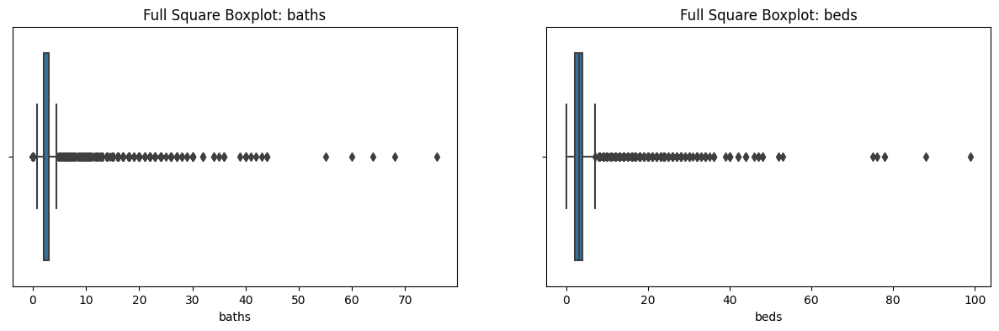

In [57]:
# Проверим признак baths и beds на наличие выбросов построив коробчатую диаграмму
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

boxplot = sns.boxplot(data = data, x="baths", ax=axes[0]);
boxplot.set_title("Full Square Boxplot: baths");

boxplot = sns.boxplot(data = data, x="beds", ax=axes[1]);
boxplot.set_title("Full Square Boxplot: beds");


display(data["baths"].describe()) # рассчитаем статистические показатели для baths
display(data["beds"].describe()) # рассчитаем статистические показатели для beds

Мы видим явное наличие выбросов в признаках baths и beds. Уменьшим максимум ванн и спален до 30 и 40, так как бывают большие особняки. В минимуме оставим нули, так как бывают студии(нет отдельной спальни), так же могу отсутствовать ванная и комната(когда продают землю).

In [58]:
# Удаляем выбросы
baths_outliers = data[data["baths"] > 30].index
data.drop(baths_outliers, axis=0, inplace=True)

beds_outliers = data[data["beds"] > 40].index
data.drop(beds_outliers, axis=0, inplace=True)
del beds_outliers # удалим не нужную переменную

display(data["beds"].describe()) # рассчитаем статистические показатели для beds
display(data["baths"].describe()) # рассчитаем статистические показатели для baths

count    292054.000000
mean          2.989571
std           1.642067
min           0.000000
25%           2.000000
50%           3.000000
75%           4.000000
max          40.000000
Name: beds, dtype: float64

count    294585.000000
mean          2.465130
std           1.545629
min           0.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          30.000000
Name: baths, dtype: float64

count    256071.000000
mean          1.678546
std           4.031271
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max        1120.000000
Name: stories, dtype: float64

count    311042.000000
mean         39.057655
std          31.427441
min           1.000000
25%          15.000000
50%          32.000000
75%          58.000000
max         323.000000
Name: age, dtype: float64

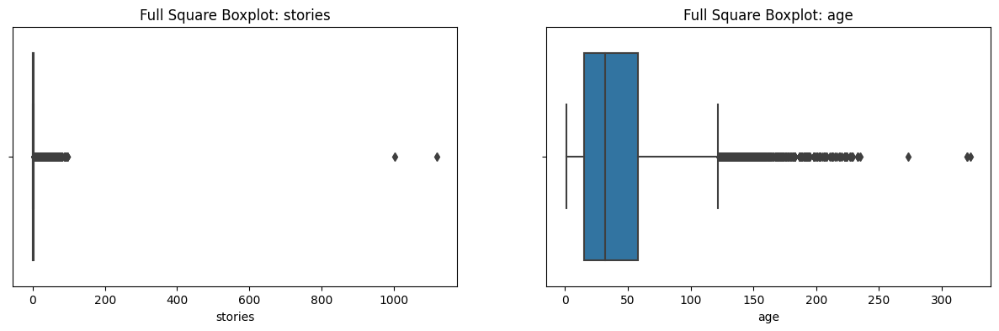

In [59]:
# Проверим признак stories и age на наличие выбросов построив коробчатую диаграмму
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

boxplot = sns.boxplot(data = data, x="stories", ax=axes[0]);
boxplot.set_title("Full Square Boxplot: stories");

boxplot = sns.boxplot(data = data, x="age", ax=axes[1]);
boxplot.set_title("Full Square Boxplot: age");


display(data["stories"].describe()) # рассчитаем статистические показатели для stories
display(data["age"].describe()) # рассчитаем статистические показатели для age

Видим выбросы в признаках stories и age, большие выбросы справа. Очень большой максимум. Уменьшим максимум stories до 50, а age до 170. 

In [60]:
# Удаляем выбросы
stories_outliers = data[data["stories"] > 50].index
data.drop(stories_outliers, axis=0, inplace=True)
del stories_outliers # удалим не нужную переменную

age_outliers = data[data["age"] > 170].index
data.drop(age_outliers, axis=0, inplace=True)
del age_outliers # удалим не нужную переменную

display(data["stories"].describe()) # рассчитаем статистические показатели для stories
display(data["age"].describe()) # рассчитаем статистические показатели для age

count    255773.000000
mean          1.637398
std           2.302637
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          50.000000
Name: stories, dtype: float64

count    310704.000000
mean         38.960258
std          31.169643
min           1.000000
25%          15.000000
50%          32.000000
75%          58.000000
max         170.000000
Name: age, dtype: float64

count    3.302760e+05
mean     6.886566e+03
std      1.597299e+06
min      1.000000e+00
25%      1.280000e+03
50%      1.835000e+03
75%      2.644000e+03
max      7.959794e+08
Name: sqft, dtype: float64

count    373838.000000
mean          4.334444
std           4.606514
min           1.000000
25%           3.000000
50%           3.000000
75%           5.000000
max          65.000000
Name: number school, dtype: float64

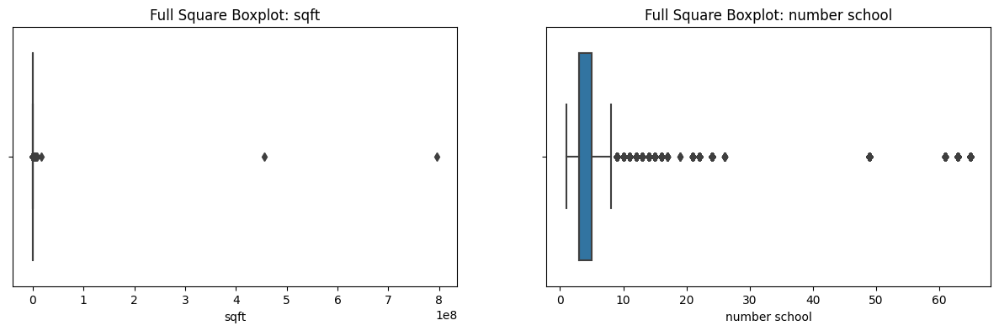

In [61]:
# Проверим признак sqft и number school на наличие выбросов построив коробчатую диаграмму
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

boxplot = sns.boxplot(data = data, x="sqft", ax=axes[0]);
boxplot.set_title("Full Square Boxplot: sqft");

boxplot = sns.boxplot(data = data, x="number school", ax=axes[1]);
boxplot.set_title("Full Square Boxplot: number school");


display(data["sqft"].describe()) # рассчитаем статистические показатели для sqft
display(data["number school"].describe()) # рассчитаем статистические показатели для number school

В признаках sqft и number school есть явные выбросы. Не реалистичен максимум для числа школ, а так же не реалистичен максимум и минимум для площади. Уменьшим максимум в числе школ до 15. Максимум площади установим 120000, а минимум 100 фунтов.

In [62]:
# Удаляем выбросы
sqft_outliers_min = data[data["sqft"] < 100].index
data.drop(sqft_outliers_min, axis=0, inplace=True)
del  sqft_outliers_min # удалим не нужную переменную

sqft_outliers_max = data[data["sqft"] > 120000].index
data.drop(sqft_outliers_max, axis=0, inplace=True)
del  sqft_outliers_max # удалим не нужную переменную

number_school_outliers = data[data["number school"] >= 15].index
data.drop(number_school_outliers, axis=0, inplace=True)
del number_school_outliers # удалим не нужную переменную

display(data["sqft"].describe()) # рассчитаем статистические показатели для sqft
display(data["number school"].describe()) # рассчитаем статистические показатели для number school

count    320642.000000
mean       2392.302473
std        3718.985652
min         100.000000
25%        1301.000000
50%        1853.000000
75%        2659.000000
max      119921.000000
Name: sqft, dtype: float64

count    362977.000000
mean          3.888897
std           2.030931
min           1.000000
25%           3.000000
50%           3.000000
75%           5.000000
max          14.000000
Name: number school, dtype: float64

count    358771.000000
mean          1.180044
std           5.447184
min           0.000000
25%           0.360000
50%           0.690000
75%           1.300000
max        1590.380000
Name: distance schools min, dtype: float64

count    358771.000000
mean          4.926759
std           7.940231
min           0.000000
25%           1.620000
50%           2.800000
75%           5.200000
max        1591.090000
Name: distance schools max, dtype: float64

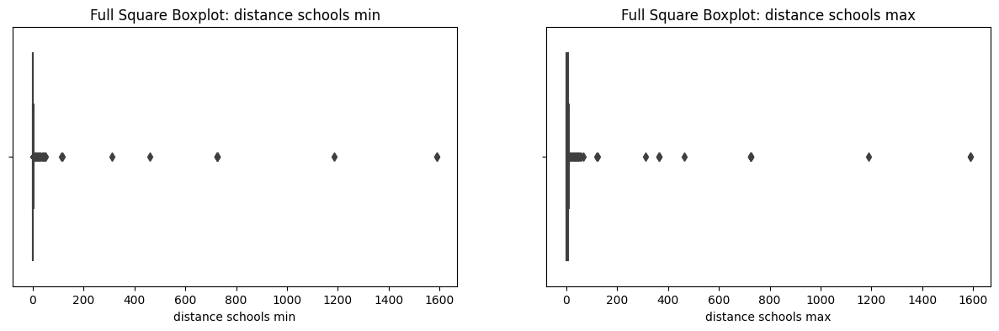

In [63]:
# Проверим признак distance schools min и distance schools max на наличие выбросов построив коробчатую диаграмму
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

boxplot = sns.boxplot(data = data, x="distance schools min", ax=axes[0]);
boxplot.set_title("Full Square Boxplot: distance schools min");

boxplot = sns.boxplot(data = data, x="distance schools max", ax=axes[1]);
boxplot.set_title("Full Square Boxplot: distance schools max");


display(data["distance schools min"].describe())  # рассчитаем статистические показатели для distance schools min
display(data["distance schools max"].describe())  # рассчитаем статистические показатели для distance schools max

В признаках distance schools min и distance schools max есть явные выбросы. Не реалистично выглядят максимумы и минимумы. Уменьшим максимум в distance schools min до 25 и минимум больше нуля. В признаке distance schools max уберем строки, где число больше 38, а так же признак не должен быть равен нулю.

In [64]:
# Удаляем выбросы
distance_outliers_min = data[data["distance schools min"] == 0].index
data.drop(distance_outliers_min, axis=0, inplace=True)

distance_outliers_min = data[data["distance schools min"] > 25].index
data.drop(distance_outliers_min, axis=0, inplace=True)
del  distance_outliers_min # удалим не нужную переменную

distance_outliers_max = data[data["distance schools max"] == 0].index
data.drop(distance_outliers_max, axis=0, inplace=True)

distance_outliers_max = data[data["distance schools max"] > 38].index
data.drop(distance_outliers_max, axis=0, inplace=True)
del  distance_outliers_max # удалим не нужную переменную

display(data["distance schools min"].describe())  # рассчитаем статистические показатели для distance schools_min
display(data["distance schools max"].describe())  # рассчитаем статистические показатели для distance schools_max

count    357563.000000
mean          1.129722
std           1.548330
min           0.010000
25%           0.360000
50%           0.690000
75%           1.300000
max          24.940000
Name: distance schools min, dtype: float64

count    357563.000000
mean          4.879292
std           5.918116
min           0.020000
25%           1.620000
50%           2.800000
75%           5.200000
max          36.200000
Name: distance schools max, dtype: float64

count    356764.000000
mean          9.091736
std           1.786666
min           1.000000
25%           9.000000
50%          10.000000
75%          10.000000
max          10.000000
Name: rating schools max, dtype: float64

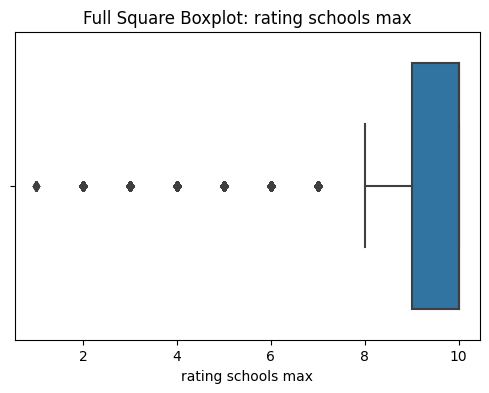

In [65]:
# Проверим признак rating schools max на наличие выбросов
fig, axes = plt.subplots(nrows=1, figsize=(6, 4))

boxplot = sns.boxplot(data = data, x="rating schools max");
boxplot.set_title("Full Square Boxplot: rating schools max");


display(data["rating schools max"].describe()) # рассчитаем статистические показатели для target

В данном признаке видим выбросы, странно, что максимальный рейтинг школы где-то равен 1. Очистим выброс, поставим, что значение должно быть больше или равно 3. Признак rating schools mean проверять на выбросы не будем, так как он связан с rating schools max, и будет достаточно очистить его.

In [66]:
# Удаляем выбросы
rating_outliers = data[data["rating schools max"] <= 3].index
data.drop(rating_outliers, axis=0, inplace=True)
del rating_outliers  # удалим не нужную переменную

display(data["rating schools max"].describe())

count    350159.000000
mean          9.209888
std           1.579756
min           4.000000
25%          10.000000
50%          10.000000
75%          10.000000
max          10.000000
Name: rating schools max, dtype: float64

count    3.551640e+05
mean     6.557010e+05
std      1.846376e+06
min      1.000000e+00
25%      1.950000e+05
50%      3.290000e+05
75%      5.950000e+05
max      1.950000e+08
Name: target, dtype: float64

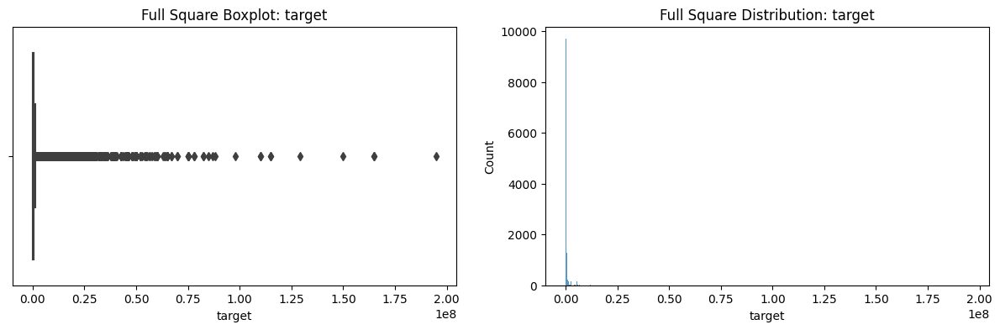

In [67]:
# Проверим признак target на наличие выбросов построив коробчатую диаграмму и гистограмму
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

boxplot = sns.boxplot(data = data, x="target", ax=axes[0]);
boxplot.set_title("Full Square Boxplot: target");

boxplot = sns.histplot(data= data, x="target", ax=axes[1]);
boxplot.set_title("Full Square Distribution: target");


display(data["target"].describe()) # рассчитаем статистические показатели для target

В целевом признаке target мы видим явные выбросы. Минимум и максимум выглядят не реалистично. Поэтому уберем все строки где цена меньше 1000, и все стороки болше 800000, так как хоть жилье и может стоить дороже, но такого жилья мало и данная информация может сбивать модель.

In [68]:
# Удаляем выбросы
target_outliers = data[data["target"] < 1000].index
data.drop(target_outliers, axis=0, inplace=True)
del target_outliers # удалим не нужную переменную

target_outliers = data[data["target"] > 800000].index
data.drop(target_outliers, axis=0, inplace=True)
del target_outliers  # удалим не нужную переменную

display(data["target"].describe()) # рассчитаем статистические показатели для target

# Посмотрим еще раз на основные статистические характеристики всего датасета
display(data.describe())

# Удалим не нужную переменную boxplot
del boxplot

count    297212.000000
mean     311999.032277
std      190405.788202
min        1000.000000
25%      172000.000000
50%      279950.500000
75%      425000.000000
max      800000.000000
Name: target, dtype: float64

,private pool,baths,sqft,beds,stories,target,heating,cooling,parking,age,number school,there is a private school,distance schools min,distance schools max,rating schools max,rating schools mean
count,297212.000000,238153.000000,264600.000000,236698.000000,210207.000000,297212.000000,297212.000000,297212.000000,297212.000000,249359.000000,297212.000000,297212.000000,293908.000000,293908.000000,293209.000000,293209.000000
mean,0.101624,2.231306,2098.187395,2.850251,1.513620,311999.032277,0.744004,0.638955,0.495300,38.539291,3.885038,0.127579,1.169718,4.870924,9.161298,6.817318
std,0.302154,1.165225,3448.765800,1.413166,1.754606,190405.788202,0.436420,0.480304,0.499979,29.994367,2.051995,0.333621,1.604408,5.737743,1.631225,1.591211
min,0.000000,0.000000,100.000000,0.000000,0.000000,1000.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.010000,0.020000,4.000000,1.600000
25%,0.000000,2.000000,1241.000000,2.000000,1.000000,172000.000000,0.000000,0.000000,0.000000,15.000000,3.000000,0.000000,0.400000,1.700000,9.000000,6.000000
50%,0.000000,2.000000,1730.000000,3.000000,1.000000,279950.500000,1.000000,1.000000,0.000000,33.000000,3.000000,0.000000,0.700000,2.900000,10.000000,7.000000
75%,0.000000,3.000000,2390.000000,4.000000,2.000000,425000.000000,1.000000,1.000000,1.000000,56.000000,4.000000,0.000000,1.300000,5.300000,10.000000,8.000000
max,1.000000,30.000000,119921.000000,30.000000,49.000000,800000.000000,1.000000,1.000000,1.000000,170.000000,14.000000,1.000000,24.940000,35.900000,10.000000,10.000000


### 2.18 Заполняем пропуски

In [69]:
# Смотрим, где остались пропуски
data.isna().sum()

status                           0
private pool                     0
propertyType                     0
baths                        59059
city                             0
sqft                         32612
beds                         60514
state                            0
stories                      87005
target                           0
heating                          0
cooling                          0
parking                          0
age                          47853
number school                    0
there is a private school        0
distance schools min          3304
distance schools max          3304
rating schools max            4003
rating schools mean           4003
dtype: int64

Пропусков много. Заменим их медианами вычисленными по группам. Это поможет заполнить пропуски максимально реалистично.

In [70]:
# Вычислим медиану площади для каждого из типов жилья
proper_sqft_med = data.groupby("propertyType")["sqft"].median()

# Запускаем цикл
for p in proper_sqft_med.index:
    mask1 = data["propertyType"] == p # маска по типу недвижимости
    mask2 = data["sqft"].isna() == True # маска по пропускам в sqft
    ind = data[mask1 & mask2]["sqft"].index # сохраняем индекс
    data.loc[ind, "sqft"] = proper_sqft_med[p] # присваиваем медиану рейтингу
    
# Проверяем результаты заполнения
omissions = data["sqft"].isna().sum()
print(f"Количество пропущенных значений в sqft - {omissions}.")



# Вычислим медиану количества спален для каждого из типов жилья
proper_beds_med = data.groupby("propertyType")["beds"].median()

# Запускаем цикл
for p in proper_beds_med.index:
    mask1 = data["propertyType"] == p # маска по типу недвижимости
    mask2 = data["beds"].isna() == True # маска по пропускам в beds
    ind = data[mask1 & mask2]["beds"].index # сохраняем индекс
    data.loc[ind, "beds"] = proper_beds_med[p] # присваиваем медиану рейтингу
    
# Проверяем результаты заполнения
omissions = data["beds"].isna().sum()
print(f"Количество пропущенных значений в beds - {omissions}.")



# Вычислим медиану количества ванн для каждого из типов жилья
proper_baths_med = data.groupby("propertyType")["baths"].median()

# Запускаем цикл
for p in proper_baths_med.index:
    mask1 = data["propertyType"] == p # маска по типу недвижимости
    mask2 = data["baths"].isna() == True # маска по пропускам в baths
    ind = data[mask1 & mask2]["baths"].index # сохраняем индекс
    data.loc[ind, "baths"] = proper_baths_med[p] # присваиваем медиану рейтингу
    
# Проверяем результаты заполнения
omissions = data["beds"].isna().sum()
print(f"Количество пропущенных значений в baths - {omissions}.")



# Вычислим медиану возраста постройки для каждого из типов жилья
proper_age_med = data.groupby("propertyType")["age"].median()

# Запускаем цикл
for p in proper_age_med.index:
    mask1 = data["propertyType"] == p # маска по типу недвижимости
    mask2 = data["age"].isna() == True # маска по пропускам в age
    ind = data[mask1 & mask2]["age"].index # сохраняем индекс
    data.loc[ind, "age"] = proper_age_med[p] # присваиваем медиану рейтингу
    
# Проверяем результаты заполнения
omissions = data["age"].isna().sum()
print(f"Количество пропущенных значений в age - {omissions}.")



# Вычислим медиану количества этажей для каждого из типов жилья
proper_stories_med = data.groupby("propertyType")["stories"].median()

# Запускаем цикл
for p in proper_stories_med.index:
    mask1 = data["propertyType"] == p # маска о типу недвижимостип
    mask2 = data["stories"].isna() == True # маска по пропускам в stories
    ind = data[mask1 & mask2]["stories"].index # сохраняем индекс
    data.loc[ind, "stories"] = proper_stories_med[p] # присваиваем медиану рейтингу
    
# Проверяем результаты заполнения
omissions = data["stories"].isna().sum()
print(f"Количество пропущенных значений в stories - {omissions}.")




# Вычислим медиану минимальной дистанции до школы по штатам
state_distance_min_med = data.groupby("state")["distance schools min"].median()

# Запускаем цикл
for p in state_distance_min_med.index:
    mask1 = data["state"] == p # маска по штатам
    mask2 = data["distance schools min"].isna() == True # маска по пропускам в distance schools_min
    ind = data[mask1 & mask2]["distance schools min"].index # сохраняем индекс
    data.loc[ind, "distance schools min"] = state_distance_min_med[p] # присваиваем медиану рейтингу

# Проверяем результаты заполнения
omissions = data["distance schools min"].isna().sum()
print(f"Количество пропущенных значений в distance schools min - {omissions}.")

  
    
# Вычислим медиану максимальной дистанции до школы по штатам
state_distance_max_med = data.groupby("state")["distance schools max"].median()

# Запускаем цикл
for p in state_distance_max_med.index:
    mask1 = data["state"] == p # маска по штатам
    mask2 = data["distance schools max"].isna() == True # маска по пропускам в distance schools_max
    ind = data[mask1 & mask2]["distance schools max"].index # сохраняем индекс
    data.loc[ind, "distance schools max"] = state_distance_max_med[p] # присваиваем медиану рейтингу

# Проверяем результаты заполнения
omissions = data["distance schools max"].isna().sum()
print(f"Количество пропущенных значений в distance schools max - {omissions}.") 
 
 
    
# Вычислим медиану максимального рейтинга школы по штатам
state_rating_max_med = data.groupby("state")["rating schools max"].median()

# Запускаем цикл
for p in state_rating_max_med.index:
    mask1 = data["state"] == p # маска по штатам
    mask2 = data["rating schools max"].isna() == True # маска по пропускам в rating schools max
    ind = data[mask1 & mask2]["rating schools max"].index # сохраняем индекс
    data.loc[ind, "rating schools max"] = state_rating_max_med[p] # присваиваем медиану рейтингу

# Проверяем результаты заполнения
omissions = data["rating schools max"].isna().sum()
print(f"Количество пропущенных значений в rating schools max - {omissions}.")  
 
 
    
# Вычислим медиану среднего рейтинга школы по штатам
state_rating_mean_med = data.groupby("state")["rating schools mean"].median()  

# Запускаем цикл
for p in state_rating_mean_med.index:
    mask1 = data["state"] == p # маска по штатам
    mask2 = data["rating schools mean"].isna() == True # маска по пропускам в rating schools mean
    ind = data[mask1 & mask2]["rating schools mean"].index # сохраняем индекс
    data.loc[ind, "rating schools mean"] = state_rating_mean_med[p] # присваиваем медиану рейтингу

# Проверяем результаты заполнения
omissions = data["rating schools mean"].isna().sum()
print(f"Количество пропущенных значений в rating schools mean - {omissions}.") 

# Если тип недвижимости land, то возраста нет, выведем новый признак, в котором если тип недвижимости land,
# то возраст 0, потом соединим этот признак с основным
data["age 1"] = data["propertyType"].apply(lambda x: 0 if "land" in x else np.nan)
data["age"] = data["age 1"].combine_first(data["age"])

# Удаляем не нужный признак 
data.drop(["age 1"], axis=1, inplace=True)

# Проверяем результаты заполнения
omissions = data["age"].isna().sum()
print(f"Количество пропущенных значений в age - {omissions}.")

# Удалим не нужные переменные
del omissions
del proper_sqft_med
del proper_beds_med
del proper_baths_med
del proper_age_med
del proper_stories_med
del state_distance_min_med
del state_distance_max_med
del state_rating_max_med
del state_rating_mean_med

Количество пропущенных значений в sqft - 0.
Количество пропущенных значений в beds - 0.
Количество пропущенных значений в baths - 0.
Количество пропущенных значений в age - 0.
Количество пропущенных значений в stories - 0.
Количество пропущенных значений в distance schools min - 3.
Количество пропущенных значений в distance schools max - 3.
Количество пропущенных значений в rating schools max - 3.
Количество пропущенных значений в rating schools mean - 3.
Количество пропущенных значений в age - 0.


In [72]:
# Удаляем строки, в которых все еще остались пропуски
data.dropna(axis=0, subset="distance schools min", inplace=True)
data.dropna(axis=0, subset="distance schools max", inplace=True)
data.dropna(axis=0, subset="rating schools max", inplace=True)
data.dropna(axis=0, subset="rating schools mean", inplace=True)
data.dropna(axis=0, subset="beds", inplace=True)
data.dropna(axis=0, subset="baths", inplace=True)

### 2.19 Еще раз разберем признак с городами

В признаке city много уникальных значений, они могут запутать модель. Поэтому города стоит сгруппировать. 

Города разделю на три группы: крупный город штата(1), столица штата(2), другие города(0). Часто столица и крупны город это два разных города. Информацию о столицах возьмем с сайта https://bigdave44.com/features/the-mine/us-states-abbreviations-capitals-nicknames/, информацию о крупных городах возьмем с сайта https://www.immihelp.com/us-states-capitals-and-largest-cities/, а так же дополним ее из википедии https://ru.wikipedia.org/wiki/%D0%A8%D0%B0%D0%B1%D0%BB%D0%BE%D0%BD:%D0%9A%D1%80%D1%83%D0%BF%D0%BD%D0%B5%D0%B9%D1%88%D0%B8%D0%B5_%D0%B3%D0%BE%D1%80%D0%BE%D0%B4%D0%B0_%D0%A1%D0%A8%D0%90.

После распределения городов, можно будет удалить признак city.

In [73]:
# Берем адрес страницы с сокращениями штатов и название столицы. Выполняем GET-запрос
url = "https://bigdave44.com/features/the-mine/us-states-abbreviations-capitals-nicknames/"
response = requests.get(url)
if response.status_code != 200:
    print(f"Ошибка {url}: {response.status_code}") # выводим номер ошибки, если она произойдет
# Создаём объект BeautifulSoup, указывая html-парсер
page = BeautifulSoup(response.text, "html.parser")
# Ищем на странице  строки с названием, аббревиатурой и столицей штата
raw_data = page.find_all("td")
# Из строк формируем список в формате: аббревиатура, столица
states_cap = [r_d.text for r_d in raw_data][4:203]

# Формируем датафрем из названий аббревиатур штатов и столиц
cap_df = pd.DataFrame(list(zip(states_cap[1::4],
                               states_cap[2::4])),
                      columns = ["state", "capital"])
# Переводим все столицы и аббревиатуры в нижний регистр 
cap_df["state"] = cap_df["state"].str.lower()
cap_df["capital"] = cap_df["capital"].str.lower()


# Добавляем получившийся датасет к основному
data = pd.merge(
    left = data,
    right = cap_df,
    on = "state",
    how = "left"
)

# Преобразуем данные в строки
data["capital"] = data["capital"].astype(str)
data["city"] = data["city"].astype(str) 

# Генерируем признак нахождения в столице штата, сюда отнесем и город washington. Хоть он не столица штата, но является столицей США,
# поэтому думаю его можно отнести к этой группе
data["capital1"] = data[["city", "capital"]].apply(lambda x: 2 if (x["city"] == x["capital"]) or ("washington" in x["city"]) else 0, axis=1)




# Берем адрес с названием столицы штата и названием крупного города. Выполняем GET-запрос
url = "https://www.immihelp.com/us-states-capitals-and-largest-cities/"
response = requests.get(url)
if response.status_code != 200:
    print(f"Ошибка {url}: {response.status_code}")  # выводим номер ошибки, если она произойдет
# Создаём объект BeautifulSoup, указывая html-парсер
page = BeautifulSoup(response.text, "html.parser")
# Ищем на странице все строки с названием столицей штата и крупного города
raw_data = page.find_all("td")
# Из строк формируем список в формате: столица, крупный город
cap_lar = [r_d.text for r_d in raw_data][1:395]

# Формируем датафрем из названий столиц, крупных городов
lar_df = pd.DataFrame(list(zip(cap_lar[0::3],
                               cap_lar[1::3])),
                      columns = ["capital", "largest city"])
# Переводим все столицы и крупные города в нижний регистр
lar_df["largest city"] = lar_df["largest city"].str.lower()
lar_df["capital"] = lar_df["capital"].str.lower()

# Добавляем получившийся датасет к основному
data = pd.merge(
    left = data,
    right = lar_df,
    on = "capital",
    how = "left"
)

# Преобразуем данные в строки
data["largest city"] = data["largest city"].astype(str)

# Убираем лишние слово, так как в нашем датасете оно не используется
data["largest city"] = data["largest city"].apply(lambda x: x.replace(" city", ""))

# Генерируем признак нахождения в крупном городе
data["largest city 1"] = data[["city", "largest city"]].apply(lambda x: 1 if (x["city"] == x["largest city"]) or ("san antonio" in x["city"])\
    or ("dallas" in x["city"]) or ("san diego" in x["city"]) or ("san francisco" in x["city"]) or ("san jose" in x["city"]) \
        or ("fort worth" in x["city"]) else 0, axis=1)



# Создаем новый признак тип города                  
data["types city"] = data[["capital1", "largest city 1"]].apply(lambda x: x["largest city 1"] if x["capital1"] < x["largest city 1"] else x["capital1"], axis=1)

# Удаляем не нужные признаки
data.drop(["capital", "capital1", "largest city", "largest city 1", "city"], axis=1, inplace=True)

# Удалим не нужные переменные
del url
del response
del page
del raw_data
del states_cap
del cap_df
del cap_lar
del lar_df


# Изучим основные статистические характеристики после очистки
display(data.describe())

,private pool,baths,sqft,beds,stories,target,heating,cooling,parking,age,number school,there is a private school,distance schools min,distance schools max,rating schools max,rating schools mean,types city
count,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000,297209.000000
mean,0.101625,2.197038,2150.477173,2.927127,1.454917,312000.835712,0.744012,0.638961,0.495305,34.416619,3.885067,0.127580,1.165144,4.850988,9.169571,6.815937,0.467654
std,0.302156,1.047147,3269.671773,1.341852,1.499570,190405.766830,0.436416,0.480303,0.499979,29.156183,2.051985,0.333622,1.596653,5.710627,1.624622,1.582055,0.646213
min,0.000000,0.000000,100.000000,0.000000,0.000000,1000.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.010000,0.020000,4.000000,1.600000,0.000000
25%,0.000000,2.000000,1289.000000,2.000000,1.000000,172000.000000,0.000000,0.000000,0.000000,10.000000,3.000000,0.000000,0.400000,1.700000,9.000000,6.000000,0.000000
50%,0.000000,2.000000,1766.000000,3.000000,1.000000,279955.000000,1.000000,1.000000,0.000000,31.000000,3.000000,0.000000,0.700000,2.900000,10.000000,7.000000,0.000000
75%,0.000000,3.000000,2534.000000,4.000000,2.000000,425000.000000,1.000000,1.000000,1.000000,50.000000,4.000000,0.000000,1.300000,5.210000,10.000000,8.000000,1.000000
max,1.000000,30.000000,119921.000000,30.000000,49.000000,800000.000000,1.000000,1.000000,1.000000,170.000000,14.000000,1.000000,24.940000,35.900000,10.000000,10.000000,2.000000


После очистки данных количество строк сократилось до 297209. Мы убрали дубликаты, создали новые признаки, удалили не нужные признаки. В данных больше нет пропусков. Так же мы удалили все выбросы. Данные готовы для исследования и подготовки их для моделирования.

# 3. Иследование данных

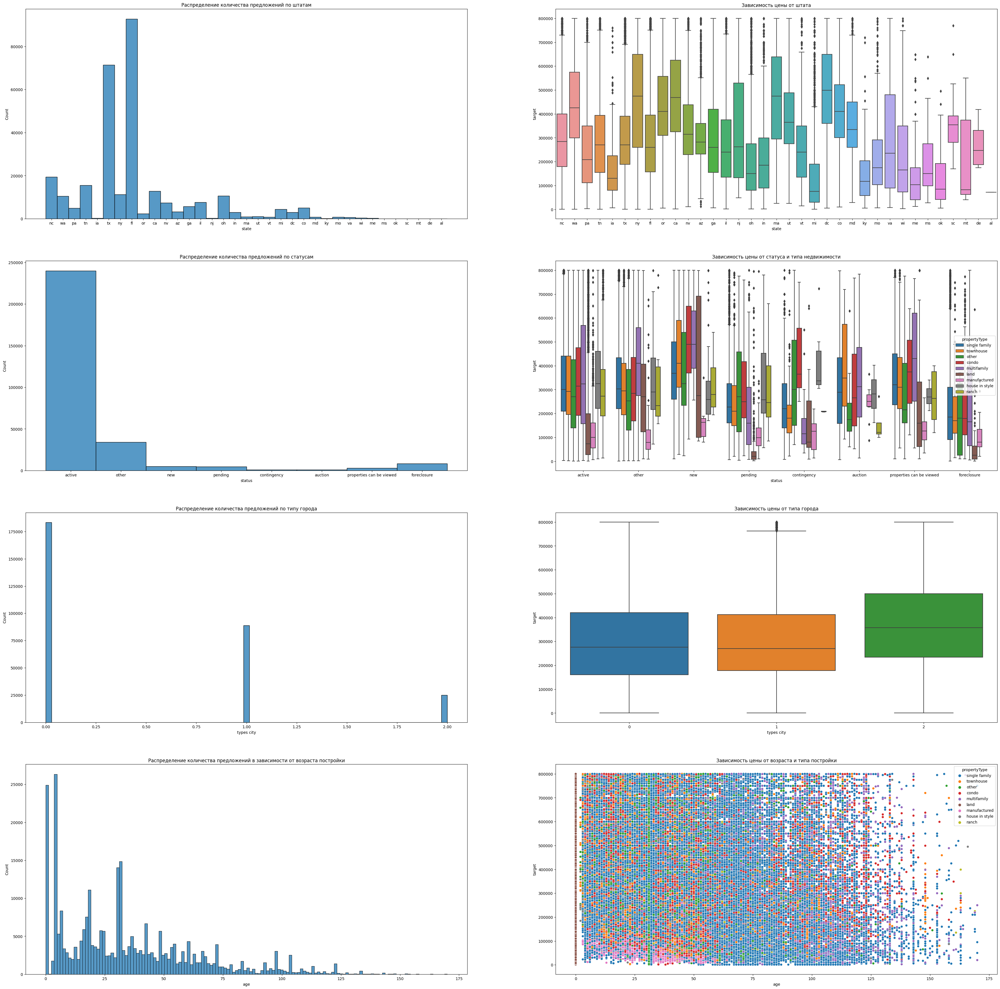

In [74]:
# Проверим распределение предложений в зависимости от параметров статус
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(45, 45))


# Признак state
schedule = sns.histplot(data = data, x="state", ax=axes[0][0]);
schedule.set_title("Распределение количества предложений по штатам");

schedule = sns.boxplot(data = data, x="state", y = "target", ax=axes[0][1]);
schedule.set_title("Зависимость цены от штата");


# Признак status
schedule = sns.histplot(data = data, x="status", ax=axes[1][0]);
schedule.set_title("Распределение количества предложений по статусам");

schedule = sns.boxplot(data = data, x="status", y = "target", hue = "propertyType", ax=axes[1][1]);
schedule.set_title("Зависимость цены от статуса и типа недвижимости");


# Признак types city"
schedule = sns.histplot(data = data, x="types city", ax=axes[2][0]);
schedule.set_title("Распределение количества предложений по типу города");

schedule = sns.boxplot(data = data, x="types city", y = "target", ax=axes[2][1]);
schedule.set_title("Зависимость цены от типа города");


# Признак age
schedule = sns.histplot(data = data, x="age", ax=axes[3][0]);
schedule.set_title("Распределение количества предложений в зависимости от возраста постройки");

schedule = sns.scatterplot(data = data, x="age", y = "target", hue = "propertyType", ax=axes[3][1]);
schedule.set_title("Зависимость цены от возраста и типа постройки");


# Удаляем не нужную переменную
del schedule 

По первым двум графикам видно, что больше всего предложений недвижимости находится в штатах tx и fl(в каждом количество предложений больше 60000) при этом цены на недвижимость там не такие высокие в среднем 250000. Самые высокие цены в штатах ny, ca, dc, ma в среднем 650000, в штате dc, ma мало предложений, меньше 5000, а вот в штатах ny, ca количество предложений в среднем в каждом чуть меньше чем 20000. Можно сделать предположение, что чем больше вариантов недвижимости, при условии, что штаты популярны, тем она стоит дешевле. Там где мало вариантов и штат популярен стоимость поднимается. Так же жилье стоит дешевле в некоторых штатах, где мало предложений и они менее интересны для переезда в сравнении с другими штатами.

Больше всего предложения в статусе "активны" свыше 200000. В среднем самая дорогая недвижимость новая. В зависимости от статуса самая дорогая цена бывает у разных типов недвижимости. Самая дешевая недвижимость land и manufactured.

Предложений о недвижимости больше всего в средних и небольших городах, в столицах и крупных городах предложений меньше, если брать все предложения по США. Это нормально, так как средних и небольших городов намного больше, чем столиц и крупных городов. Цены на недвижимость в целом одинаковые, но в столице чуть дороже. Отсюда могу сделать вывод, что данный признак не очень влияет на цену.

Самая популярная недвижимость новая. Так большая часть недвижимости не старше 30 лет. Самый популярный возраст 3 или 25 лет и 26. 0 лет возможно популярно из-за типа land. По графику рассеивания можно заметить, что самая популярная недвижимость типа single family, а так же то что большая часть multifamily старше 50 лет, а сейчас новые здания в основном single family, townhouse и condo. Чем моложе недвижимость тем она дороже, еще самая дешевая недвижимость относится к типу land и manufactured. Manufactured обычно не старше 50 лет.

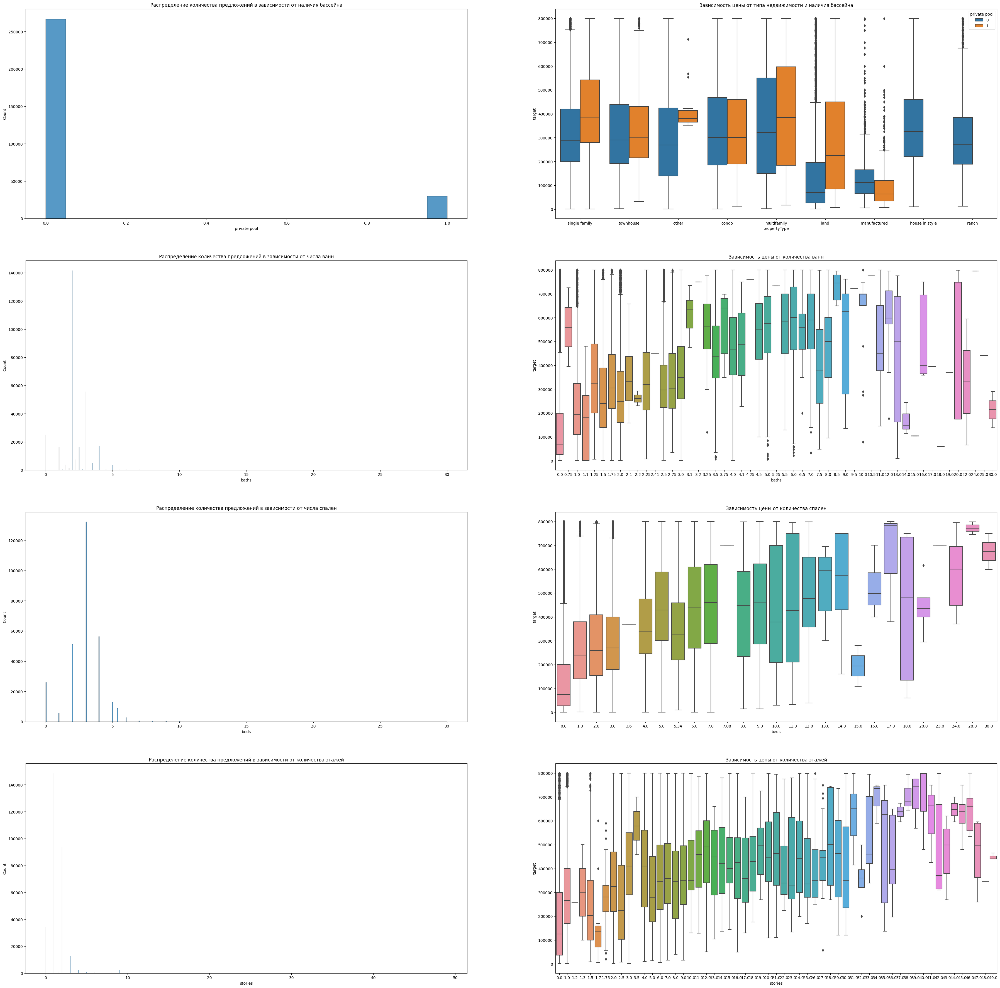

In [75]:
# Проверим распределение предложений в зависимости от параметров статус
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(45, 45))


# Признак private pool
schedule = sns.histplot(data = data, x="private pool", ax=axes[0][0]);
schedule.set_title("Распределение количества предложений в зависимости от наличия бассейна");

schedule = sns.boxplot(data = data, x="propertyType", y = "target", hue = "private pool", ax=axes[0][1]);
schedule.set_title("Зависимость цены от типа недвижимости и наличия бассейна");


# Признак baths
schedule = sns.histplot(data = data, x="baths", ax=axes[1][0]);
schedule.set_title("Распределение количества предложений в зависимости от числа ванн");

schedule = sns.boxplot(data = data, x="baths", y = "target", ax=axes[1][1]);
schedule.set_title("Зависимость цены от количества ванн");


# Признак beds
schedule = sns.histplot(data = data, x="beds", ax=axes[2][0]);
schedule.set_title("Распределение количества предложений в зависимости от числа спален");

schedule = sns.boxplot(data = data, x="beds", y = "target", ax=axes[2][1]);
schedule.set_title("Зависимость цены от количества спален");


# Признак stories
schedule = sns.histplot(data = data, x="stories", ax=axes[3][0]);
schedule.set_title("Распределение количества предложений в зависимости от количества этажей");

schedule = sns.boxplot(data = data, x="stories", y = "target", ax=axes[3][1]);
schedule.set_title("Зависимость цены от количества этажей");


# Удаляем не нужную переменную
del schedule 

Бассейн встречается меньше чем в 50000 недвижимостях. Его наличие поднимает стоимость для всех типов недвижимости, кроме condo и manufactured. Так же совсем нет бассейнов у типов недвижимости ranch и house in style.

Самое популярное число ванн от 2 до 3. Чем больше полных ванн, то видна тенденция на увеличение в среднем стоимости недвижимости. Выделяется сильно только количество ванн 0.75, такое их число заметно увеличивает стоимость в среднем, и 30 или 14 ванн заметно не дорогая цена в среднем. 0.75 так влияет на стоимость, скорей всего, потому что может в основном, встречается в столицах и крупных городах, где часто небольшие квартиры, но из-за положения цена у такой недвижимости высокая. 14 и 30 ванн так низки скорей всего из-за своей не популярности, и скорей всего встречались в нескольких не дорогих недвижимостях.

Чаще всего в недвижимости встречается 3 спальни. Чем больше спален, тем выше стоимость недвижимости. В среднем самая дорогая недвижимость  содержит в себе 13 - 14 спален.

Больше всего недвижимости одноэтажной. 0 встречаются там, где продают просто землю. Чем больше этажей, тем может быть дороже недвижимость, это наблюдается в целом до 41 этажа, дальше значимость количества этажей падает. Больше всего стоит недвижимость с 34 этажами.

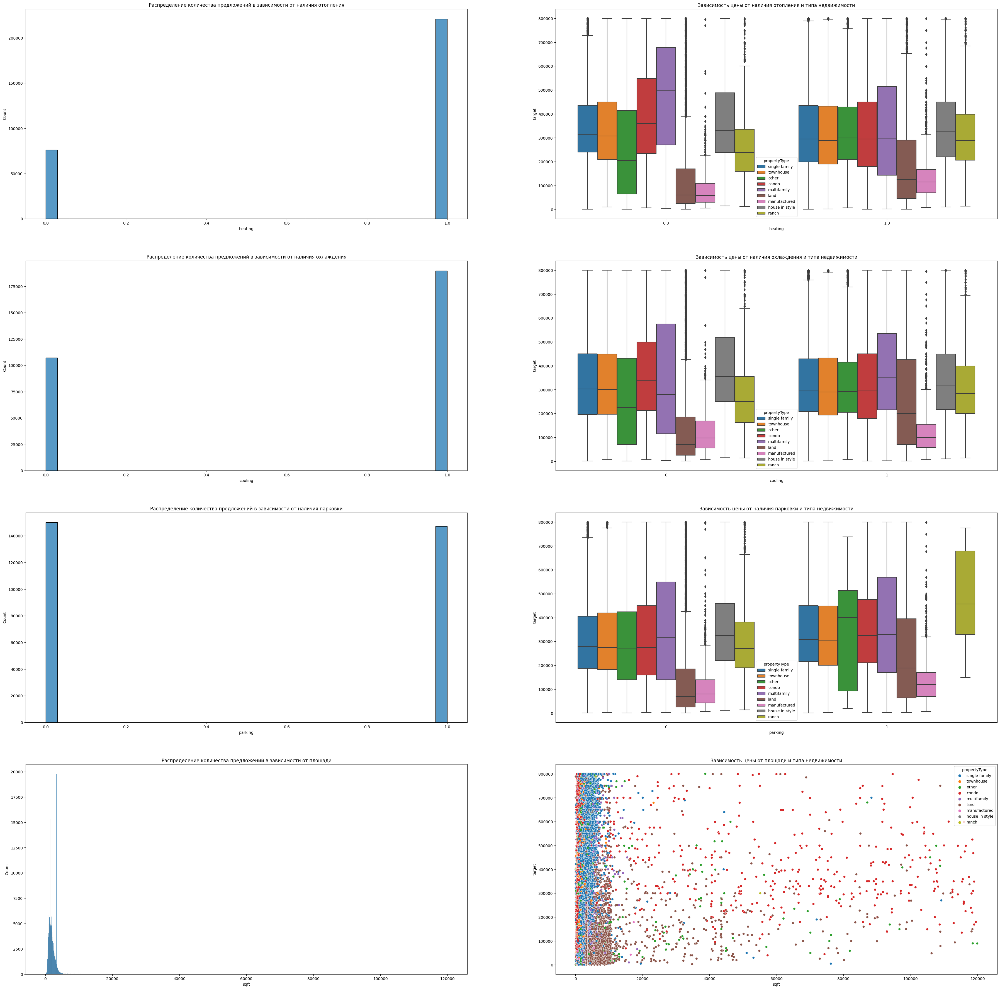

In [76]:
# Проверим распределение предложений в зависимости от параметров статус
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(45, 45))


# Признак heating
schedule = sns.histplot(data = data, x="heating", ax=axes[0][0]);
schedule.set_title("Распределение количества предложений в зависимости от наличия отопления");

schedule = sns.boxplot(data = data, x="heating", y = "target", hue = "propertyType", ax=axes[0][1]);
schedule.set_title("Зависимость цены от наличия отопления и типа недвижимости");


# Признак cooling
schedule = sns.histplot(data = data, x="cooling", ax=axes[1][0]);
schedule.set_title("Распределение количества предложений в зависимости от наличия охлаждения");

schedule = sns.boxplot(data = data, x="cooling", y = "target", hue = "propertyType", ax=axes[1][1]);
schedule.set_title("Зависимость цены от наличия охлаждения и типа недвижимости");


# Признак parking
schedule = sns.histplot(data = data, x="parking", ax=axes[2][0]);
schedule.set_title("Распределение количества предложений в зависимости от наличия парковки");

schedule = sns.boxplot(data = data, x="parking", y = "target", hue = "propertyType", ax=axes[2][1]);
schedule.set_title("Зависимость цены от наличия парковки и типа недвижимости");


# Признак sqft
schedule = sns.histplot(data = data, x="sqft", ax=axes[3][0]);
schedule.set_title("Распределение количества предложений в зависимости от площади");

schedule = sns.scatterplot(data = data, x="sqft", y = "target", hue = "propertyType", ax=axes[3][1]);
schedule.set_title("Зависимость цены от площади и типа недвижимости");


# Удаляем не нужную переменную
del schedule 

В большинстве недвижимостей есть обогрев. Если он есть, то в среднем, цена не сильно меняется в зависимости от типа недвижимость(иск. condo и multifamily). Так его отсутствие увеличивает среднюю цену на тип недвижимости condo и multifamily. Я думаю это может быть связано с тем, что такой вид постройки без обогревателя может в основном находиться в южных штатах. Из-за чего его отсутствие не сильно влияет на стоимость, но недвижимость на юге может стоить сама по себе больше. 

Большая часть недвижимости имеет охлаждение. Ее наличие в среднем не сильно влияет на стоимость разных типов недвижимости.

Недвижимости, где есть место для парковки, чуть больше, чем недвижимости без парковки. Наличие или отсутствие парковочного места в целом не сильно влияет на цену. Возможно, у недвижимости которая не имеет явной парковки, имеет недалеко место где можно оставить машину, поэтому даже отсутствие парковки не критично.

Самая часто встречающиеся площадь недвижимости чуть больше 2000 футов. Самый частый тип недвижимости больше 2000 фунтов singl family, меньше 2000 и больше 10000 фунтов обычно тип недвижимости condo. Причем большая площадь от 6000 фунтов может встречаться у типов singl family и land.

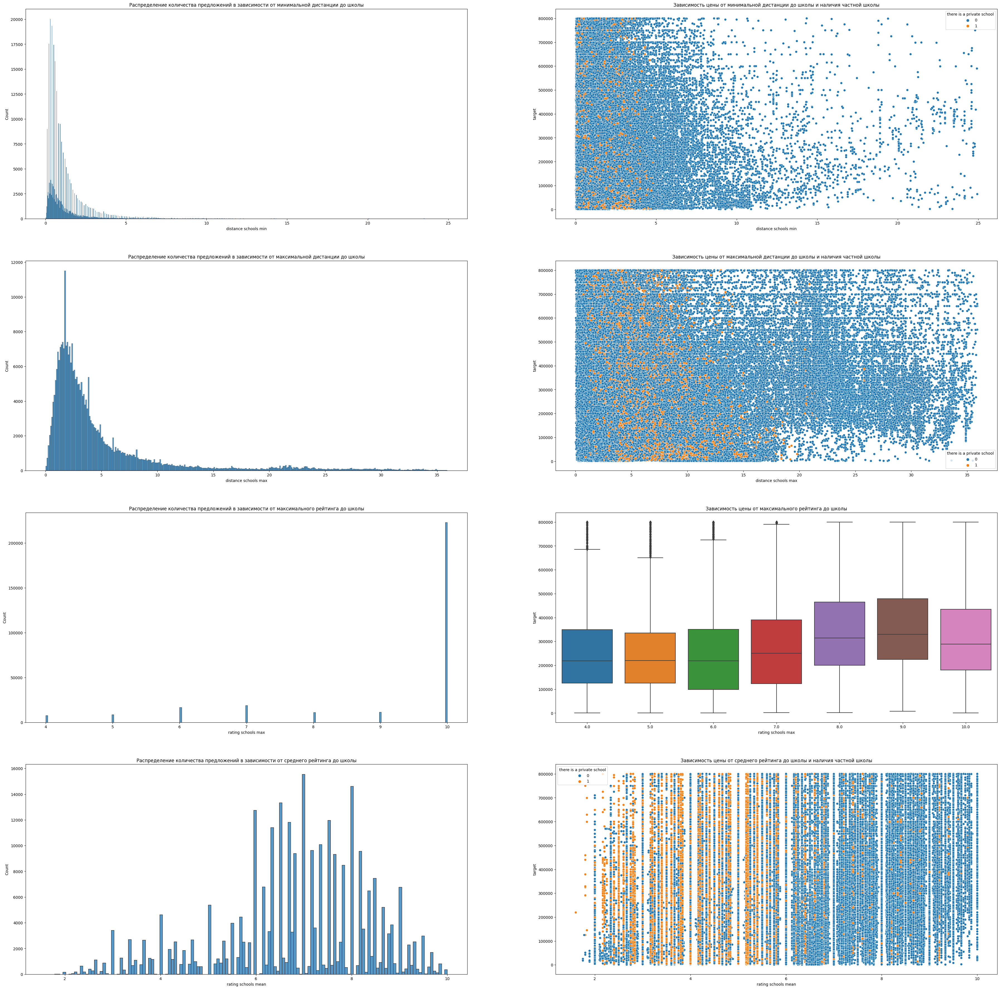

In [77]:
# Проверим распределение предложений в зависимости от параметров статус
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(45, 45))


# Признак distance schools min
schedule = sns.histplot(data = data, x="distance schools min", ax=axes[0][0]);
schedule.set_title("Распределение количества предложений в зависимости от минимальной дистанции до школы");

schedule = sns.scatterplot(data = data, x="distance schools min", y = "target", hue = "there is a private school", ax=axes[0][1]);
schedule.set_title("Зависимость цены от минимальной дистанции до школы и наличия частной школы");


# Признак distance schools max
schedule = sns.histplot(data = data, x="distance schools max", ax=axes[1][0]);
schedule.set_title("Распределение количества предложений в зависимости от максимальной дистанции до школы");

schedule = sns.scatterplot(data = data, x="distance schools max", y = "target", hue = "there is a private school", ax=axes[1][1]);
schedule.set_title("Зависимость цены от максимальной дистанции до школы и наличия частной школы");


# Признак rating schools ma
schedule = sns.histplot(data = data, x="rating schools max", ax=axes[2][0]);
schedule.set_title("Распределение количества предложений в зависимости от максимального рейтинга до школы");

schedule = sns.boxplot(data = data, x="rating schools max", y = "target", ax=axes[2][1]);
schedule.set_title("Зависимость цены от максимального рейтинга до школы");


# Признак rating schools mean
schedule = sns.histplot(data = data, x="rating schools mean", ax=axes[3][0]);
schedule.set_title("Распределение количества предложений в зависимости от среднего рейтинга до школы");

schedule = sns.scatterplot(data = data, x="rating schools mean", y = "target", hue = "there is a private school", ax=axes[3][1]);
schedule.set_title("Зависимость цены от среднего рейтинга до школы и наличия частной школы");


# Удаляем не нужную переменную
del schedule 

В основном минимальное расстояние до школы до 1 мили. У дорогой недвижимости школа будет находиться близко. Если ближайшая школа дальше 4 мили, то количество дорогой недвижимости уменьшается. Максимальное расстояние обычно не превышает 35. И так же, дорогая недвижимость обычно встречается там, где даже далекая школа будет близко. Так места, где есть частные школы имеют небольшое минимальное расстояние, и не большое максимальное расстояние.

Самая часта максимальная оценка 10. Значит рядом с недвижимостью обычно есть хотя бы одна хорошая школа. Чем выше оценка, тем выше цена. Самая дорогая недвижимость при оценках 9. Возможно там хорошая школы, и есть много требовательных родителей.

Чаще всего средний рейтинг бывает 6 - 8. По последнему графику видно, что когда есть частная школа, почему-то рейтинг школ средний низкий. Это может быть связано с тем, что к частным школам применяют более строгие правила. При этом из этого графика не видно, чтобы наличие частной школы, повышало стоимость недвижимости. 

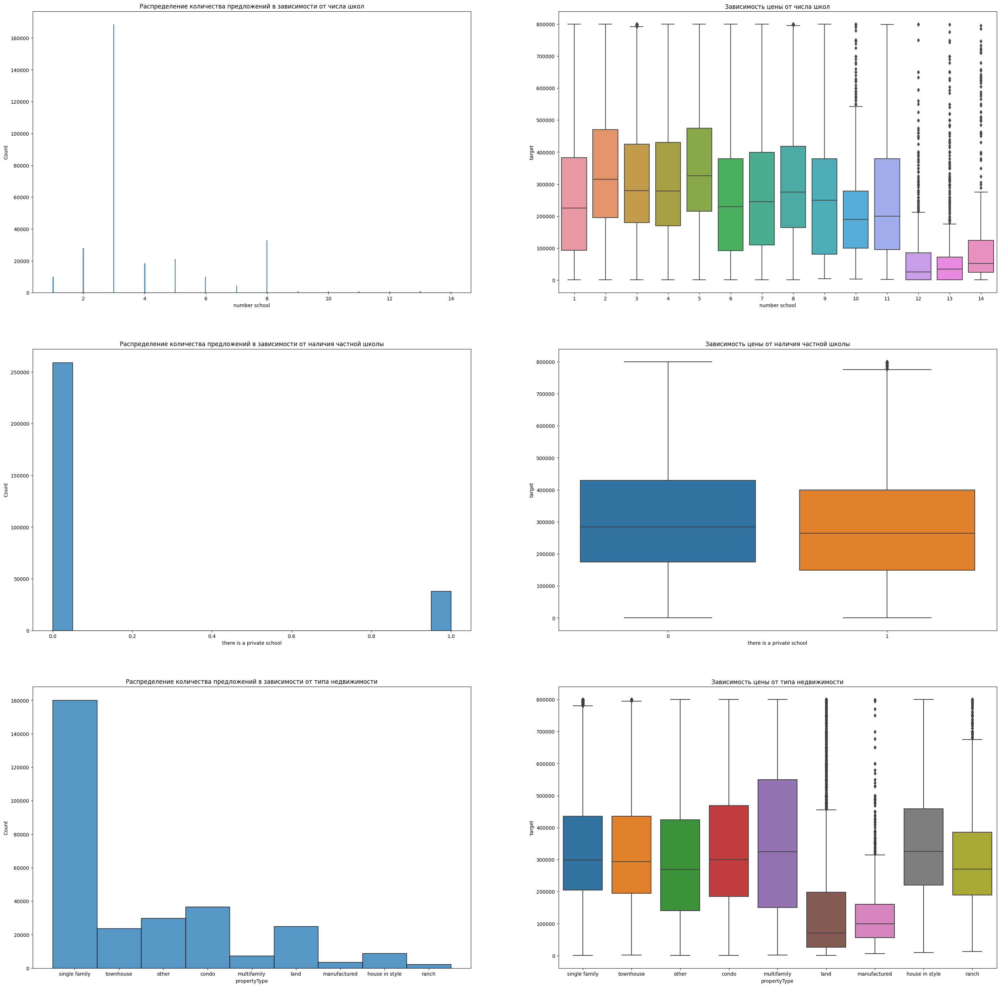

In [78]:
# Проверим распределение предложений в зависимости от параметров статус
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(35, 35))


# Признак number school
schedule = sns.histplot(data = data, x="number school", ax=axes[0][0]);
schedule.set_title("Распределение количества предложений в зависимости от числа школ");

schedule = sns.boxplot(data = data, x="number school", y = "target", ax=axes[0][1]);
schedule.set_title("Зависимость цены от числа школ");


# Признак there is a private school
schedule = sns.histplot(data = data, x="there is a private school", ax=axes[1][0]);
schedule.set_title("Распределение количества предложений в зависимости от наличия частной школы");

schedule = sns.boxplot(data = data, x="there is a private school", y = "target", ax=axes[1][1]);
schedule.set_title("Зависимость цены от наличия частной школы");


# Признак propertyType
schedule = sns.histplot(data = data, x="propertyType", ax=axes[2][0]);
schedule.set_title("Распределение количества предложений в зависимости от типа недвижимости");

schedule = sns.boxplot(data = data, x="propertyType", y = "target", ax=axes[2][1]);
schedule.set_title("Зависимость цены от типа недвижимости");


# Удаляем не нужную переменную
del schedule 

Чаще всего в описании недвижимости упоминают 3 школы. До 5 школ цена недвижимости растет, а в дальнейшем большое количество школ указывает на сниженную недвижимость. 

Частная школа в описании недвижимости встречается не частно. Данный факт почти не влияет на среднюю стоимость недвижимости.

Исследуя другие признаки, мы уже поняли, что чаще всего встречается тип недвижимости single family. В среднем самый дешевый тип недвижимости land, а дорогой multifamily.

Вывод: Признаки наличие частной школы, наличие парковки, максимальный рейтинг школы, тип города почти не влияют на стоимость недвижимости. Штат, площадь, возраст постройки, число ванн и спален, дистанция максимальная и минимальная до школы, тип недвижимости заметно влияют на цену недвижимости. Остальные средне влияют на цену недвижимости.

# 4. Статистический анализ данных

Исследуя данные мы смогли определить признаки, которые скорей всего сильно влияют на стоимость недвижимости, и те, что не влияют на цену и в дальнейшем возможно придется их удалить, если это подтвердиться. На данный момент хочу сделать несколько гипотез:
1. Есть значимая разница в цене между постройками моложе 4 лет, 4 - 15 лет, и старше 15 лет. Но нулевую гипотезу мы запишем как: "Нет значимой разницы в цене между постройками моложе 4 лет, 4 - 15 лет, и старше 15 лет", так если мы отвергнем нулевую гипотезу, то подтвердим свою.
2. Есть значимая разница в цене между наличием 1, 2-3 или больше школ рядом с недвижимостью. Но нулевую гипотезу мы запишем как: "Нет значимой разницы в цене между наличием 1, 2-3 или больше школ рядом с недвижимостью.
3. Нет значимой разницы в цене в разных типах города.

Сначала проведем тест на нормальность для изучаемых признаков. Хоть уже по очистке было видно, что признаки распространены не нормально. Чтобы выбрать подходящий тип теста.

Уровень значимости alpha указан в пункте 1, при исследовании данных, и равен 0.05.

### 4.1 Тест на нормальность Д’Агостино

In [79]:
# Выдвиним нулевую и альтернативную гипотезу 
H0 = "Данные распределены нормально"
Ha = "Данные не распределены нормально (мы отвергаем H0)"



# Проведем тест для признака age
_, p = normaltest(data.age) #normaltest возвращает двустороннюю вероятность для проверки гипотезы

# Выведем его результат
print("p=%.3f" % p)

# Выведем его интерпретация 
if p > alpha/2:
	print(H0)
else:
	print(Ha)

 
 
 # Проведем тест для признака number school
_, p = normaltest(data["number school"]) #normaltest возвращает двустороннюю вероятность для проверки гипотезы

# Выведем его результат
print("p=%.3f" % p)

# Выведем его интерпретация 
if p > alpha/2:
	print(H0)
else:
	print(Ha)



 # Проведем тест для признака types city
_, p = normaltest(data["types city"]) #normaltest возвращает двустороннюю вероятность для проверки гипотезы

# Выведем его результат
print("p=%.3f" % p)

# Выведем его интерпретация 
if p > alpha/2:
	print(H0)
else:
	print(Ha)

p=0.000
Данные не распределены нормально (мы отвергаем H0)
p=0.000
Данные не распределены нормально (мы отвергаем H0)
p=0.000
Данные не распределены нормально (мы отвергаем H0)


Наши данные не распределены нормально, значит мы должны выбирать непараметрические тесты для анализа гипотез. В качестве теста на сравнение выборок выберем тест Краскела-Уоллиса.

### 4.2 Тест Краскела-Уоллиса

In [80]:
# Проведем тест для первой гипотезы
# Разделим данные на группы по возрасту
group1 = data[data["age"] < 4]
group2 = data[(data["age"] >= 4) & (data.age <= 15)].any()
group3 = data[data["age"] > 15]

# Проведем тест для целевого признака target
_, p = kruskal(group1.target, group2.target, group3.target)
# Гипотезы
H0 = "Нет значимой разницы в цене между постройками моложе 4 лет, 4 - 15 лет, и старше 15 лет"
Ha = "Есть значимая разница в цене между постройками моложе 4 лет, 4 - 15 лет, и старше 15 лет"

if p>alpha:
  print(f"{p} > {alpha}. Мы не можем отвергнуть нулевую гипотезу. {H0}")
else:
  print(f"{p} <= {alpha}. Мы отвергаем нулевую гипотезу. {Ha}")



# Проведем тест для второй гипотезы
# Разделим данные на группы по числу школ
group1 = data[data["number school"] == 1]
group2 = data[(data["number school"] >= 2) & (data["number school"] <= 3)].any()
group3 = data[data["number school"] > 3]

# Проведем тест для целевого признака target
_, p = kruskal(group1.target, group2.target, group3.target)
# Гипотезы
H0 = "Нет значимой разницы в цене между наличием 1, 2-3 или больше школ рядом с недвижимостью"
Ha = "Есть значимая разница в цене между наличием 1, 2-3 или больше школ рядом с недвижимостью"

if p>alpha:
  print(f"{p} > {alpha}. Мы не можем отвергнуть нулевую гипотезу. {H0}")
else:
  print(f"{p} <= {alpha}. Мы отвергаем нулевую гипотезу. {Ha}")



# Проведем тест для третий гипотезы
# Разделим данные на группы по типу города
group1 = data[data["types city"] == 0]
group2 = data[data["types city"] == 1]
group3 = data[data["types city"] == 2]

# Проведем тест для целевого признака target
_, p = kruskal(group1.target, group2.target, group3.target)
# Гипотезы
H0 = "Нет значимой разницы в цене в разных типах город."
Ha = "Есть значимая разница в цене в разных типах города"

if p>alpha:
  print(f"{p} > {alpha}. Мы не можем отвергнуть нулевую гипотезу. {H0}")
else:
  print(f"{p} <= {alpha}. Мы отвергаем нулевую гипотезу. {Ha}")



# Удалим не нужные переменные
del group1
del group2
del group3

0.0 <= 0.05. Мы отвергаем нулевую гипотезу. Есть значимая разница в цене между постройками моложе 4 лет, 4 - 15 лет, и старше 15 лет
2.7090849564623625e-92 <= 0.05. Мы отвергаем нулевую гипотезу. Есть значимая разница в цене между наличием 1, 2-3 или больше школ рядом с недвижимостью
0.0 <= 0.05. Мы отвергаем нулевую гипотезу. Есть значимая разница в цене в разных типах города


Тесты показали интересный результат. Первая и вторая мои гипотезы подтвердилась, возраст недвижимости и число школ сильно влияет на стоимость. Третья гипотеза не подтвердилась. Тип города(столица, крупный город, другие города) значимо оказывают воздействие на целевой признак. 

# 5. Преобразование и отбор признаков

### 5.0 Сохраним очищенный датасет

In [81]:
# Сохраним подготовленный датасет, чтобы работая с моделями повторно не очищать данные
#data.to_csv("data/data_clean.csv", index=False)

# Загрузим подготовленный датасет
#data = pd.read_csv("data/data_clean.csv")

### 5.1 Кодирование признаков

Закодируем категорийный признаки, после чего их удалим.

In [113]:
# Создаем список признаков для одиночного кодирования
oh_cols = ["status", "propertyType", "state"]

# Создаем объект одиночного кодирования и выполняем кодирование
encoder = ce.OneHotEncoder(cols=oh_cols, use_cat_names=True)
encoded_data = encoder.fit_transform(data[oh_cols])

# Присоединяем к датафрейму закодированные признаки
data = pd.concat([data, encoded_data], axis=1)


# Удалим исходные признаки и выведем размер датафрейма
data = data.drop(["status", "propertyType", "state"], axis=1)
print("Размер получившегося датафрейма:", data.shape)

Размер получившегося датафрейма: (297209, 69)


### 5.2 Корреляция

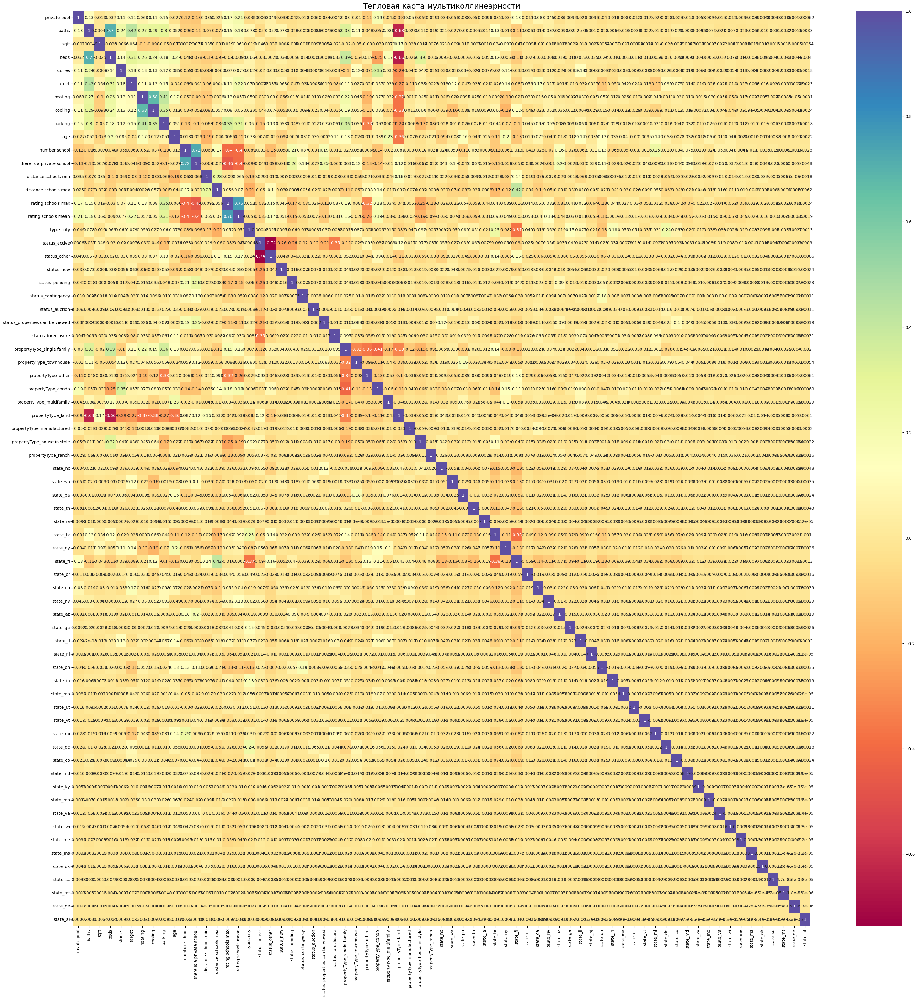

In [85]:
# Смотрим взаимосвязи между признаками. Чтобы не было мультиколлинеарность
plt.rcParams['figure.figsize'] = (40,40)
heatmap = sns.heatmap(data.corr(numeric_only=True), annot=True, cmap= "Spectral");
heatmap.set_title("Тепловая карта мультиколлинеарности", fontsize=18);

В наборе данных мультиколлинеарность практически отсутствует. Есть высокая коллинеарность между there is a private school и number school, beds и baths, rating schools mean и rating schools max, status_active и status_other. Но коэффициент корреляции между ними лишь немного выше, а при удалении их метрики ухудшаются. Поэтому принято решение их оставить.

### 5.3 Подготовка данных для модели

Как мы уже выяснили из статистических тестов, наши данные распределены не нормально. Так же наши данные измеряются в разных единицах и имеют большой разброс в значениях. Данные мы нормализуем. А нашу целевую переменную логарифмируем.

In [114]:
# Логарифмируем целевую переменную
data["target"] = np.log(data["target"]+1)

# Разбиваем датафрейм на части, необходимые для обучения и тестирования модели  
# Х - данные с информацией об отелях, у - целевая переменная (рейтинги отелей)  
X = data.drop(["target"], axis = 1)  
y = data["target"] 

# Воспользуемся специальной функцие train_test_split для разбивки тестовых данных
# выделим 30% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Проверяем
y_train.shape, y_test.shape, X.shape, X_train.shape, X_test.shape

((208046,), (89163,), (297209, 68), (208046, 68), (89163, 68))

In [115]:
# Создаем объект класса MinMaxScaler
scaler = MinMaxScaler()

# Подгоняем нормализатор под тренировочную выборку
scaler.fit(X_train)

# Выделяем названия признаков
col_names = list(X_train.columns)

# Нормализуем обе выборки и сразу преобразуем их в датафреймы
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=col_names)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=col_names)

В дальнейшем окажется, что модели на нормализованных признаках показывает результат хуже или такой же, как на обычных признаках. Поэтому все модели будут обучаться и сравниваться на признаках без нормализации. Но если модель дорабатывать(дополнять примерами), то данный пункт может понадобиться.

### 5.4 Отбор признаков с помощью SelectKBest

In [116]:
# Для всех моделей, которые могут пойти в продакшн
# Создаем объект класса SelectKBest и выбираем 63 самых значимых признаков.
# Токое число получилось с помощью метода ручного подбора
kbest = SelectKBest(score_func=f_regression, k=63)

# Подгоняем его под даные и получаем список лучших 63 признаков
kbest.fit(X_train, y_train)
kbest_columns = kbest.get_feature_names_out()

# Оставляем лучшие признаки в датафреймах
X_train = X_train[kbest_columns]
X_test = X_test[kbest_columns]

# Выведем ответ на вопрос задания на экран
print('Отобранные 63 признаков:', kbest_columns)

Отобранные 63 признаков: ['private pool' 'baths' 'sqft' 'beds' 'stories' 'heating' 'cooling'
 'parking' 'age' 'number school' 'there is a private school'
 'distance schools min' 'distance schools max' 'rating schools max'
 'rating schools mean' 'types city' 'status_active' 'status_other'
 'status_new' 'status_pending' 'status_contingency'
 'status_properties can be viewed' 'status_foreclosure'
 'propertyType_single family' 'propertyType_townhouse'
 'propertyType_other' 'propertyType_condo' 'propertyType_multifamily'
 'propertyType_land' 'propertyType_manufactured'
 'propertyType_house in style' 'propertyType_ranch' 'state_nc' 'state_wa'
 'state_pa' 'state_tn' 'state_ia' 'state_tx' 'state_ny' 'state_fl'
 'state_or' 'state_ca' 'state_nv' 'state_az' 'state_ga' 'state_il'
 'state_oh' 'state_in' 'state_ma' 'state_ut' 'state_vt' 'state_mi'
 'state_dc' 'state_co' 'state_md' 'state_ky' 'state_mo' 'state_va'
 'state_wi' 'state_me' 'state_ms' 'state_ok' 'state_sc']


# 6. Моделирования

Создадим несколько моделей:
* Линейную регрессию
* Дерево решений
* Градиентный бустинг над деревом решений
* Случайный лес
* Стекинг моделей регрессии
* Бустинг CatBoostRegressor
* ElasticNet

В качестве метрик будем использовать среднеквадратическую ошибку (Mean Squared Error, MSE), средне абсолютную ошибку (Mean Absolute Error, MAE) и коэффициент детерминации (R**2). 

MSE - не очень доступна для понимания, но каждая ошибка вносит свой квадратичный штраф, большие расхождения между предсказанием и истиной увеличивают штраф. Поможет нам сравнивать модели.

MAE - помогает оценить абсолютную ошибку: насколько в среднем число в предсказании разошлось с реальным числом.

R**2 - помогает понять, какую долю разнообразия (дисперсии) смогла уловить модель в данных. Позволяет сравнить, насколько модель лучше, чем простое предсказание средним.

### 6.1 Создадим baseline модель

В качестве baseline модель используем модель линейной регрессии обученную на 3 признаках, по которым мы выдвигали гипотезы, и площади. Интуитивно кажется, что это самые важные параметры.

In [117]:
X_train_naive = X_train[["number school", "types city", "age", "sqft"]]
X_test_naive = X_test[["number school", "types city", "age", "sqft"]]

# Обучим модель линейной регрессии
model = LinearRegression()
model.fit(X_train_naive, y_train)

# Выполним предсказание
y_train_pred = model.predict(X_train_naive)
y_test_pred = model.predict(X_test_naive)

# вычисляем требуемые метрики
mse_train = metrics.mean_squared_error(y_train, y_train_pred)
mse_test = metrics.mean_squared_error(y_test, y_test_pred)
mae_train = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train = metrics.r2_score(y_train, y_train_pred)
r2_test = metrics.r2_score(y_test, y_test_pred)

# выводим метрики
print(f"Train MSE: {mse_train:.2f}")
print(f"Test MSE: {mse_test:.2f}")
print(f"Train MAE: {mae_train:.2f}")
print(f"Test MAE: {mae_test:.2f}")
print(f"Train R2: {r2_train:.2f}")
print(f"Test R2: {r2_test:.2f}")

Train MSE: 0.81
Test MSE: 0.81
Train MAE: 0.64
Test MAE: 0.64
Train R2: 0.03
Test R2: 0.03


MSE, как для обучающей, так и для тестовой выборки составляет 0.81. Так как модель демонстрирует одинаковые показатели на обеих выборках, можно сказать, что она не страдает от переобучения.

MAE в данном случае составляет 0.64 для обучающей и для тестовой выборки. Схожесть метрик, так же указывает на отсутствие переобучения.

R**2 в данном случае составляет 0.03 как для обучающей, так и для тестовой выборки. То, что метрика близка к нулю, свидетельствует о том, что модель слабо объясняет зависимость между переменными.

Данная модель обладает низкой предсказательной способности модели.

### 6.2 Линейная регрессия со всеми признаками

In [118]:
# создаём модель линейной регрессии
model_lr = LinearRegression()

# вычисляем коэффициенты регрессии
%time model_lr.fit(X_train, y_train)

# делаем предсказания с помощью модели
y_train_pred = model_lr.predict(X_train)
y_test_pred = model_lr.predict(X_test)

# вычисляем требуемые метрики
mse_train_lr = metrics.mean_squared_error(y_train, y_train_pred)
mse_test_lr = metrics.mean_squared_error(y_test, y_test_pred)
mae_train_lr = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test_lr = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train_lr = metrics.r2_score(y_train, y_train_pred)
r2_test_lr = metrics.r2_score(y_test, y_test_pred)

# выводим метрики
print(f"Train MSE: {mse_train_lr:.2f}")
print(f"Test MSE: {mse_test_lr:.2f}")
print(f"Train MAE: {mae_train_lr:.2f}")
print(f"Test MAE: {mae_test_lr:.2f}")
print(f"Train R2: {r2_train_lr:.2f}")
print(f"Test R2: {r2_test_lr:.2f}")

CPU times: total: 2.91 s
Wall time: 4.31 s
Train MSE: 0.47
Test MSE: 0.47
Train MAE: 0.48
Test MAE: 0.48
Train R2: 0.44
Test R2: 0.44


MSE в данном случае, как для обучающей, так и для тестовой выборки составляет 0.47. Чем ниже значение, тем лучше предсказывает модель. Данная модель предсказывает не очень точно, но лучше, чем базовая.

MAE в данном случае составляет 0.48 для обучающей и для тестовой выборки. Низкие значения MAE также говорят о хорошей точности предсказания. Данная модель лучше, чем базовая.

R**2 в данном случае составляет 0.44 как для обучающей, так и для тестовой выборки, что означает, что модель объясняет 44% дисперсии зависимой переменной.

Результаты модели показывают, что она работает с одинаковой точностью на обучающем и тестовом наборе данных, что свидетельствует о том, что модель не переобучилась. Однако, коэффициент детерминации указывает на то, что модель определяющая стоимость может быть лучше. Так же эта версия Линейной регрессии лучше базовой линейной регрессии обученной на нескольких признаках.

### 6.3 Дерево решений

In [119]:
# Строим и обучаем модель дерева решений
model_tree = DecisionTreeRegressor(
    max_depth = 30,
    min_samples_leaf = 20,
    random_state = 42)

# Обучаем модель
%time model_tree.fit(X_train, y_train)

# Выполняем предсказание
y_train_pred = model_tree.predict(X_train)
y_test_pred = model_tree.predict(X_test)


# вычисляем требуемые метрики
mse_train_tree = metrics.mean_squared_error(y_train, y_train_pred)
mse_test_tree = metrics.mean_squared_error(y_test, y_test_pred)
mae_train_tree = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test_tree = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train_tree = metrics.r2_score(y_train, y_train_pred)
r2_test_tree = metrics.r2_score(y_test, y_test_pred)

# выводим метрики
print(f"Train MSE: {mse_train_tree:.2f}")
print(f"Test MSE: {mse_test_tree:.2f}")
print(f"Train MAE: {mae_train_tree:.2f}")
print(f"Test MAE: {mae_test_tree:.2f}")
print(f"Train R2: {r2_train_tree:.2f}")
print(f"Test R2: {r2_test_tree:.2f}")

CPU times: total: 4.47 s
Wall time: 13.6 s
Train MSE: 0.21
Test MSE: 0.27
Train MAE: 0.30
Test MAE: 0.34
Train R2: 0.75
Test R2: 0.67


MSE в данном случае, для обучающей выборки составляет 0.21, а для тестовой выборки 0.27. Такое различие указывает на  переобучение модели.

MAE в данном случае, значения составили 0.27 для обучающей выборки и 0.30 для тестовой выборки. Разница между этими значениями также указывать на переобучение.

R**2 в данном случае, равен 0.75 для обучающей выборки и 0.67 для тестовой выборки. Эти значения указывают на то, что модель также переобучена.

В целом, метрики улучшились по сравнению с базовой моделью линейной регрессии и моделью линейной регрессией на всех признаках. Результаты показывают, что модель имеет хорошую производительность на обучающей выборке, но на тестовой выборке результаты хуже, что свидетельствует о переобучении.

### 6.4 Градиент бустинга над деревом решений

In [120]:
# Строим модель градиентного бустинга
model_boo = GradientBoostingRegressor(
    learning_rate=0.5,
    n_estimators=300,
    max_depth=6, 
    min_samples_split=30,
    random_state=42,
    verbose=2
)

# Обучаем модель
model_boo.fit(X_train, y_train)

# Выполняем предсказание
y_train_pred = model_boo.predict(X_train)
y_test_pred = model_boo.predict(X_test)

# вычисляем требуемые метрики
mse_train_boo = metrics.mean_squared_error(y_train, y_train_pred)
mse_test_boo = metrics.mean_squared_error(y_test, y_test_pred)
mae_train_boo = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test_boo = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train_boo = metrics.r2_score(y_train, y_train_pred)
r2_test_boo = metrics.r2_score(y_test, y_test_pred)

# выводим метрики
print(f"Train MSE: {mse_train_boo:.2f}")
print(f"Test MSE: {mse_test_boo:.2f}")
print(f"Train MAE: {mae_train_boo:.2f}")
print(f"Test MAE: {mae_test_boo:.2f}")
print(f"Train R2: {r2_train_boo:.2f}")
print(f"Test R2: {r2_test_boo:.2f}")

      Iter       Train Loss   Remaining Time 
         1           0.5365           31.70m
         2           0.4374           28.88m
         3           0.3936           25.81m
         4           0.3649           25.18m
         5           0.3509           23.48m
         6           0.3349           22.49m
         7           0.3276           21.72m
         8           0.3208           21.75m
         9           0.3156           21.09m
        10           0.3123           20.67m
        11           0.3062           20.31m
        12           0.2994           20.24m
        13           0.2964           19.77m
        14           0.2909           19.74m
        15           0.2888           19.45m
        16           0.2867           19.25m
        17           0.2834           19.00m
        18           0.2759           18.87m
        19           0.2735           19.00m
        20           0.2709           18.82m
        21           0.2699           18.74m
        2

MSE в данном случае, для обучающей выборки составляет 0.16, а для тестовой выборки 0.22. Такое различие указывает на переобучение модели.

MAE в данном случае, для обучающей выборки составляет 0.26, а для тестовой выборки 0.30. Разница между этими значениями указывает, что переобучения нет.

R**2 в данном случае, равен 0.81 для обучающей выборки и 0.74 для тестовой выборки. Эти значения указывают на то, что модель довольно хорошо работает на обучающей выборке и похуже на тестовой выборке, что указывает на переобучение модели.

В целом, метрики улучшились в сравнении с моделью дерева решений и базовой моделью. Разница в метриках в пользу обучающий выборки свидетельствует о переобучении.

### 6.5 Случайный лес

In [121]:
# Строим модель случайного леса
model_forest = RandomForestRegressor(
    n_estimators=200,
    max_depth=12,
    criterion='squared_error',
    min_samples_split=20,
    random_state=42,
    verbose=1
)

# Обучаем модель
model_forest.fit(X_train, y_train)

# Выполняем предсказание
y_train_pred = model_forest.predict(X_train)
y_valid_pred = model_forest.predict(X_test)

# Вычисляем требуемые метрики
mse_train_forest = metrics.mean_squared_error(y_train, y_train_pred)
mse_test_forest = metrics.mean_squared_error(y_test, y_test_pred)
mae_train_forest = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test_forest = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train_forest = metrics.r2_score(y_train, y_train_pred)
r2_test_forest = metrics.r2_score(y_test, y_test_pred)

# Выводим метрики
print(f"Train MSE: {mse_train_forest:.2f}")
print(f"Test MSE: {mse_test_forest:.2f}")
print(f"Train MAE: {mae_train_forest:.2f}")
print(f"Test MAE: {mae_test_forest:.2f}")
print(f"Train R2: {r2_train_forest:.2f}")
print(f"Test R2: {r2_test_forest:.2f}")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed: 15.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   14.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Train MSE: 0.28
Test MSE: 0.22
Train MAE: 0.37
Test MAE: 0.30
Train R2: 0.67
Test R2: 0.74


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    6.0s finished


MSE в данном случае, для обучающей выборки составляет 0.28, а для тестовой выборки 0.22. Так как тестовая выборка имеет лучше результат, чем обучающая, можно сказать, что данная модель не переобучена.

MAE в данном случае, значения составили 0.37 для обучающей выборки и 0.30 для тестовой выборки. Разница между этими значениями также указывать на отсутствие переобучение.

R**2 в данном случае, равен 0.67 для обучающей выборки и 0.74 для тестовой выборки. Эти значения указывают на то, что модель хорошо работает на обучающей выборке и лучше предсказывает на тестовой выборке. Переобучения нет.

В целом, метрики по тестовой выборке хорошие. Результат метрик чуть хуже, чем у градиента бустинга над деревом решений и лучше, чем у базовой модели. Переобучения нет.

### 6.6 Стекинг моделей регрессии

In [122]:
# Создаем список моделей для стекинга с подобранными ранее параметрами
estimators = [   
    ("lr", LinearRegression()
        ),
    ("dt", DecisionTreeRegressor(
        max_depth = 29,
        min_samples_leaf = 20,
        random_state = 42)
    ),
    ("rf", RandomForestRegressor(
        n_estimators = 200,
        max_depth = 12,
        min_samples_leaf = 20,
        warm_start = True,
        random_state = 42)
    )
    
]


# Создаем объект класса стекинг
model_stack = StackingRegressor(
    estimators = estimators,
    final_estimator = RandomForestRegressor(
        n_estimators = 200,
        max_depth = 12,
        min_samples_leaf = 20,
        warm_start = True,
        random_state = 42),
    cv = 2,
    n_jobs = -1,
    verbose = 5
)

# Обучаем модель
%time model_stack.fit(X_train, y_train)

# Делаем предсказание
y_train_pred = model_stack.predict(X_train)
y_test_pred = model_stack.predict(X_test)

# Вычисляем требуемые метрики
mse_train_stack = metrics.mean_squared_error(y_train, y_train_pred)
mse_test_stack = metrics.mean_squared_error(y_test, y_test_pred)
mae_train_stack = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test_stack = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train_stack = metrics.r2_score(y_train, y_train_pred)
r2_test_stack = metrics.r2_score(y_test, y_test_pred)

# Выводим метрики
print(f"Train MSE: {mse_train_stack:.2f}")
print(f"Test MSE: {mse_test_stack:.2f}")
print(f"Train MAE: {mae_train_stack:.2f}")
print(f"Test MAE: {mae_test_stack:.2f}")
print(f"Train R2: {r2_train_stack:.2f}")
print(f"Test R2: {r2_test_stack:.2f}")

CPU times: total: 3min 59s
Wall time: 44min 29s
Train MSE: 0.23
Test MSE: 0.26
Train MAE: 0.32
Test MAE: 0.34
Train R2: 0.73
Test R2: 0.69


MSE в данном случае, для обучающей выборки составляет 0.23, а для тестовой выборки 0.26. Такое различие указывает на переобучение модели.

MAE в данном случае, значения составили 0.32 для обучающей выборки и 0.34 для тестовой выборки. Разница между этими значениями также указывать на переобучение.

R**2 в данном случае, равен 0.73 для обучающей выборки и 0.69 для тестовой выборки. Эти значения указывают на то, что модель довольно хорошо работает на обучающей выборке и неплохо предсказывает на тестовой выборке, хотя значение на тестовой выборке ниже, что также указывать на переобучение модели.

В целом, метрики стали чуть хуже по тестам, чем у модели случайного леса. Но результат лучше, чем у линейной регрессии. Результаты метрик свидетельствуют о переобучении.

### 6.7 Бустинг CatBoostRegressor

Подберем параметры с помощью  GridSearchCV.

In [123]:
param_grid = {
    'iterations': [100, 300],
    'learning_rate': [0.01, 0.1],
    'depth': [4, 8],
    'l2_leaf_reg': [1, 5],
}
cb_model = CatBoostRegressor(random_seed=42, silent=True)
grid_search = GridSearchCV(estimator=cb_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Наилучшие значения параметров: {}".format(grid_search.best_params_))

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Наилучшие значения параметров: {'depth': 8, 'iterations': 300, 'l2_leaf_reg': 1, 'learning_rate': 0.1}


In [124]:
model_cb = CatBoostRegressor(iterations=300, learning_rate=0.1, depth=8, l2_leaf_reg=1, random_seed=42, silent=True)
model_cb.fit(X_train, y_train)

# Делаем предсказание
y_train_pred = model_cb.predict(X_train)
y_test_pred = model_cb.predict(X_test)

# Вычисляем требуемые метрики
mse_train_cb = metrics.mean_squared_error(y_train, y_train_pred)
mse_test_cb = metrics.mean_squared_error(y_test, y_test_pred)
mae_train_cb = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test_cb = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train_cb = metrics.r2_score(y_train, y_train_pred)
r2_test_cb = metrics.r2_score(y_test, y_test_pred)

# Выводим метрики
print(f"Train MSE: {mse_train_cb:.2f}")
print(f"Test MSE: {mse_test_cb:.2f}")
print(f"Train MAE: {mae_train_cb:.2f}")
print(f"Test MAE: {mae_test_cb:.2f}")
print(f"Train R2: {r2_train_cb:.2f}")
print(f"Test R2: {r2_test_cb:.2f}")

Train MSE: 0.23
Test MSE: 0.24
Train MAE: 0.32
Test MAE: 0.33
Train R2: 0.73
Test R2: 0.71


MSE в данном случае для обучающей 0.23 и для тестовой выборки составляет 0.24. Это хороший результат.

MAE в данном случае составляет 0.32 для обучающей и 0.33 для тестовой выборки. Это хороший результат.

R**2 в данном случае составляет 0.73 как для обучающей и 0.71 для тестовой выборки. Это хороший результат.

Результаты модели показывают, что она работает почти с одинаковой точностью на обучающем и тестовом наборе данных, но метрики по обучающей выборке немного лучше, что свидетельствует о возможном переобучении. Метрика лучше, чем у стэкинга и базовой модели.

### 6.8 ElasticNet

Данная модель стремится объединить лучшее из гребневой регрессии и регрессии лассо, комбинируя регуляризацию L1 и L2. Поэтому попробуем и ее.

In [125]:
# Строим модель
model_en = ElasticNetCV(cv = 5, random_state=42)

# Делаем предсказание
model_en.fit(X_train, y_train)

# Делаем предсказание
y_train_pred = model_en.predict(X_train)
y_test_pred = model_en.predict(X_test)

# Вычисляем требуемые метрики
mse_train_en = metrics.mean_squared_error(y_train, y_train_pred)
mse_test_en = metrics.mean_squared_error(y_test, y_test_pred)
mae_train_en = metrics.mean_absolute_error(y_train, y_train_pred)
mae_test_en = metrics.mean_absolute_error(y_test, y_test_pred)
r2_train_en = metrics.r2_score(y_train, y_train_pred)
r2_test_en = metrics.r2_score(y_test, y_test_pred)

# Выводим метрики
print(f"Train MSE: {mse_train_en:.2f}")
print(f"Test MSE: {mse_test_en:.2f}")
print(f"Train MAE: {mae_train_en:.2f}")
print(f"Test MAE: {mae_test_en:.2f}")
print(f"Train R2: {r2_train_en:.2f}")
print(f"Test R2: {r2_test_en:.2f}")

Train MSE: 0.62
Test MSE: 0.62
Train MAE: 0.55
Test MAE: 0.55
Train R2: 0.26
Test R2: 0.26


MSE в данном случае для обучающей и для тестовой выборки составляет 0.62. Переобучения нет.

MAE в данном случае составляет 0.55 для обучающей и для тестовой выборки. Переобучения нет.

R**2 в данном случае составляет 0.27 как для обучающей и для тестовой выборки. Модель плохо понимает зависимости между переменными. Переобучения нет.

Результаты модели показывают, что она работает лучше базовой, но хуже всех предыдущих.

# 7. Финальный вывод

Мы прошли через все этапы CRISP-DM. Мы очистили, изучили, преобразовали данные и создали несколько моделей. Периодически мы возвращались назад, чтобы улучшить результат моделей. Сейчас мы выберем лучшую модель, после чего отправим ее в продакшн.

In [127]:
df_metric = {"Metric": ["Train MSE", "Test MSE", "Train MAE", "Test MAE", "Train R2", "Test R2"],
        "Базовая модель": [mse_train, mse_test, mae_train, mae_test, r2_train, r2_test],
        "Линейная регрессия": [mse_train_lr, mse_test_lr, mae_train_lr, mae_test_lr, r2_train_lr, r2_test_lr],
        "Дерево решений": [mse_train_tree, mse_test_tree, mae_train_tree, mae_test_tree, r2_train_tree, r2_test_tree],
        "Градиент бустинга над деревом решений": [mse_train_boo, mse_test_boo, mae_train_boo, mae_test_boo, r2_train_boo, r2_test_boo],
        "Случайный лес": [mse_train_forest, mse_test_forest, mae_train_forest, mae_test_forest, r2_train_forest, r2_test_forest],
        " Стекинг моделей регрессии":[mse_train_stack, mse_test_stack, mae_train_stack, mae_test_stack, r2_train_stack, r2_test_stack],
        " Бустинг CatBoostRegressor":[mse_train_cb, mse_test_cb, mae_train_cb, mae_test_cb, r2_train_cb, r2_test_cb],
        " ElasticNet":[mse_train_en, mse_test_en, mae_train_en, mae_test_en, r2_train_en, r2_test_en]}

data_metric = pd.DataFrame(df_metric)
data_metric.head(6)

,Metric,Базовая модель,Линейная регрессия,Дерево решений,Градиент бустинга над деревом решений,Случайный лес,Стекинг моделей регрессии,Бустинг CatBoostRegressor,ElasticNet
0,Train MSE,0.809141,0.467853,0.211168,0.155706,0.275046,0.227093,0.228222,0.618493
1,Test MSE,0.813322,0.471090,0.274650,0.219657,0.219657,0.261049,0.239714,0.622099
2,Train MAE,0.642596,0.482242,0.299968,0.264353,0.367650,0.316686,0.319994,0.550409
3,Test MAE,0.642771,0.483700,0.343282,0.304749,0.304749,0.340660,0.325272,0.550850
4,Train R2,0.027004,0.437404,0.746069,0.812762,0.669255,0.726920,0.725561,0.256258
5,Test R2,0.028907,0.437526,0.672073,0.737732,0.737732,0.688311,0.713785,0.257224


Исходя из полученных метрик, наилучшая модель "Градиент бустинга над деревом решений" имеет наименьший показатель ошибок MSE и MAE, вместе с высоким коэффициентом детерминации R2 (0.73) на тестовых данных. Но у модели видно переобучение. На втором месте дерево решений, но у него тоже слишком большая разница между метриками тестовой и обучающей выборками. Модель бустинга CatBoostRegressor и стекинг выглядят не плохо по метрикам, но так же можгу быть переобучены.

Для продакшн хочу взять модель RandomForestRegressor, так как она имеет небольшие показатели ошибок MSE и MAE на тестах, а так же высокий R2 0.74 на тестовых данных и 0.70 на тренировочных. Она не уступает модель бустинга CatBoostRegressor. В ней не наблюдается переобучение. Ее и возьмем в продакшн.

Данную модель можно улучшить добавлением новых примеров. Так же увеличением признаков. Например, разделением недвижимости на большое количество типов с увеличением примеров для каждого типа недвижимости. Можно добавить данные о наличии рядом магазинов, ресторанов, уровне преступности в районе. Можно добавить признак качество ремонта в недвижимости.

# 8. Подготовка модели к продакшену

С помощью библиотеки Pickle мы сериализуем выбранную обученную модель леса и сохраним ее в файл. Его нужно будет открыть и развернуть на сервере, чтобы выполнять прогнозы стоимости недвижимости.

In [128]:
# Производим сериализацию и записываем результат в файл формата pkl
with open("web/model/model_forest.pkl", "wb") as output:
    pickle.dump(model_forest, output)
    
# Зафиксируем библиотеки
#pip freeze > requirements.txt

In [129]:
#Создадим датасет для проверки модели на основе тестовой выборки
verification_data = X_test[5:10]

# Сохраним датасет для проверки модели
verification_data.to_csv("verification_data.csv", index=False)

# Посмотрим какой результат выводит наша модель 
y_test_pred_loaded = model_forest.predict(verification_data)
target = np.exp(y_test_pred_loaded)
rounded_target = np.round(target)
print(rounded_target)
# Дальнейшая работа идет в production_madel.ipynb

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


[420295. 166743.  41618. 541046.  64791.]
